# Deteccion de Lesiones ACL en Resonancias Magneticas de Rodilla
# Sistema Multi-Plano con Attention Pooling e Interpretabilidad

**Trabajo de Fin de Grado**  
**Dataset:** MRNet v1.0 (Stanford ML Group, 2018)

---

## Metodologia

1. **Analisis exploratorio** del dataset MRNet
2. **Preprocesamiento avanzado:** CLAHE + mascara de atencion anatomica
3. **Arquitectura CASCADE multi-plano** con attention pooling sobre slices
4. **Entrenamiento con validacion cruzada** 5-fold estratificada
5. **Seleccion de threshold clinico** priorizando sensibilidad
6. **Interpretabilidad:** GradCAM++ sobre slices relevantes + pesos de atencion
7. **Ablacion por plano** (post-entrenamiento)
8. **Sistema de reportes** con recomendaciones clinicas

### Attention pooling

A diferencia de MaxPooling, el attention pooling aprende un peso de importancia para cada slice mediante una capa lineal con softmax, integrando informacion de multiples cortes. Los pesos son directamente interpretables.

### Principio rector

En screening medico, un falso negativo tiene consecuencias graves. El sistema prioriza **sensibilidad sobre especificidad**.

## 1. Configuracion del entorno

In [1]:
import os
import gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    confusion_matrix, roc_curve, auc,
    f1_score, recall_score, precision_score
)

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models

import cv2
from tqdm import tqdm
import json
import copy
import kagglehub
import warnings
warnings.filterwarnings('ignore')

print(f"PyTorch: {torch.__version__}")
print(f"CUDA: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
plt.style.use('default')

PyTorch: 2.10.0+cu128
CUDA: True
GPU: Tesla T4


In [2]:
# ================================================================
# CASO DE ESTUDIO: RM PERSONAL
# ================================================================

# Cargar volúmenes (ajusta la ruta a tu dataset)
RM_PATH = "/kaggle/input/datasets/jacoboct7/my-resonancia"

personal_volumes = {}
for plane in ['sagittal', 'coronal', 'axial']:
    vol = np.load(os.path.join(RM_PATH, f'{plane}.npy'))
    personal_volumes[plane] = vol
    print(f"  {plane}: {vol.shape} (min={vol.min()}, max={vol.max()})")

print(f"\nVolúmenes listos: {list(personal_volumes.keys())}")

  sagittal: (30, 320, 320) (min=0, max=255)
  coronal: (28, 384, 384) (min=0, max=255)
  axial: (38, 320, 320) (min=0, max=255)

Volúmenes listos: ['sagittal', 'coronal', 'axial']


In [3]:
CONFIG = {
    'target_slices': 32, 'target_size': 224,'center_crop_ratio': 0.95,
    'clahe_clip_limit': 2.0, 'clahe_grid_size': 8,
    'mask_enabled': True, 'mask_center_y': 0.40, 'mask_center_x': 0.50,
    'mask_sigma_y': 0.30, 'mask_sigma_x': 0.35, 'mask_min_weight': 0.3,
    'validation_ratio': 0.2, 'batch_size': 2, 'max_epochs': 25,
    'patience': 7, 'learning_rate': 1e-4, 'phase2_pos_weight': 2.0,
    'acl_weights': [0.55, 0.35, 0.1], 'meniscus_weights': [0.30, 0.55, 0.15],
    'target_sensitivity': 0.85, 'n_folds': 5, 'random_seed': 42, 'backbone':'resnet18'
}
SAVE_DIR = '/kaggle/working/TFG_FINAL'
os.makedirs(SAVE_DIR, exist_ok=True)
for d in ['models','figures','interpretability','reports']:
    os.makedirs(os.path.join(SAVE_DIR, d), exist_ok=True)
print("Configuracion:")
for k,v in CONFIG.items(): print(f"  {k}: {v}")

Configuracion:
  target_slices: 32
  target_size: 224
  center_crop_ratio: 0.95
  clahe_clip_limit: 2.0
  clahe_grid_size: 8
  mask_enabled: True
  mask_center_y: 0.4
  mask_center_x: 0.5
  mask_sigma_y: 0.3
  mask_sigma_x: 0.35
  mask_min_weight: 0.3
  validation_ratio: 0.2
  batch_size: 2
  max_epochs: 25
  patience: 7
  learning_rate: 0.0001
  phase2_pos_weight: 2.0
  acl_weights: [0.55, 0.35, 0.1]
  meniscus_weights: [0.3, 0.55, 0.15]
  target_sensitivity: 0.85
  n_folds: 5
  random_seed: 42
  backbone: resnet18


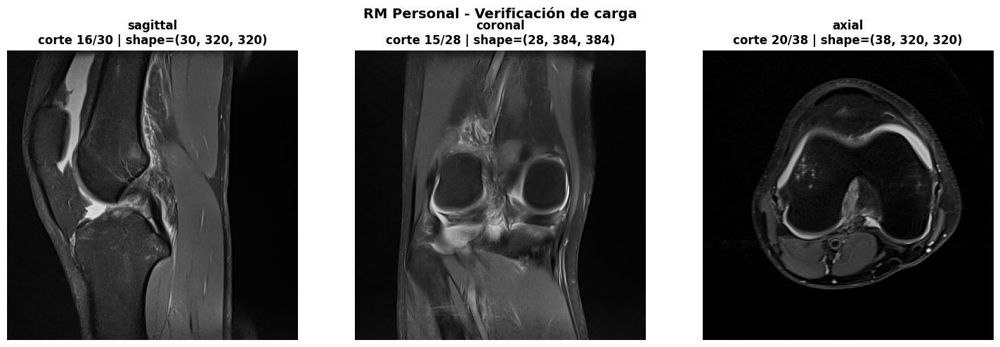

Si ves las 3 imágenes de rodilla, los datos están bien.


In [4]:
# Verificación visual de la RM personal
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for idx, (plane, vol) in enumerate(personal_volumes.items()):
    mid = vol.shape[0] // 2
    axes[idx].imshow(vol[mid], cmap='gray')
    axes[idx].set_title(f'{plane}\ncorte {mid+1}/{vol.shape[0]} | shape={vol.shape}', fontweight='bold')
    axes[idx].axis('off')
plt.suptitle('RM Personal - Verificación de carga', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
print("Si ves las 3 imágenes de rodilla, los datos están bien.")

## 2. Analisis exploratorio

In [5]:
# Carga del dataset
dataset_path = kagglehub.dataset_download("abdurrahimsheikh/mrnet-dataset")
DATA_DIR = os.path.join(dataset_path, 'MRNet-v1.0')
print(f"Directorio: {DATA_DIR}")

# Carga de etiquetas
def cargar_labels(split='train'):
    dfs = []
    for task in ['abnormal', 'acl', 'meniscus']:
        path = os.path.join(DATA_DIR, f"{split}-{task}.csv")
        df = pd.read_csv(path, header=None, names=['case', task])
        dfs.append(df)
    merged = dfs[0].merge(dfs[1], on='case').merge(dfs[2], on='case')
    merged['case'] = merged['case'].astype(str).str.zfill(4)
    return merged

train_labels = cargar_labels('train')
valid_labels = cargar_labels('valid')
all_labels = pd.concat([train_labels, valid_labels], ignore_index=True)
all_labels['source'] = ['train'] * len(train_labels) + ['valid'] * len(valid_labels)

print(f"\nCasos totales: {len(all_labels)}")
print(f"  Train original: {len(train_labels)}")
print(f"  Valid original: {len(valid_labels)}")

Directorio: /kaggle/input/datasets/abdurrahimsheikh/mrnet-dataset/MRNet-v1.0

Casos totales: 1250
  Train original: 1130
  Valid original: 120


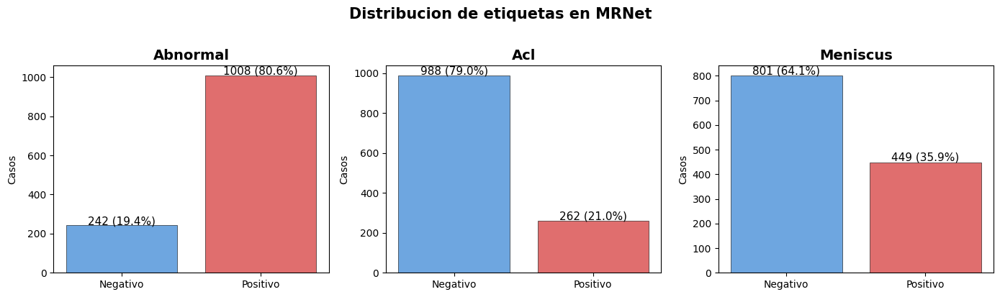


ACL positivos: 262 / 1250 (21.0%)
Ratio desbalance ACL: 1:3.8

Nota: el desbalance ~1:4 justifica el uso de pos_weight en la loss para
penalizar mas los falsos negativos durante el entrenamiento.


In [6]:
# ---------------------------------------------------------------------------
# 2.1 Distribucion de etiquetas
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

for i, task in enumerate(['abnormal', 'acl', 'meniscus']):
    counts = all_labels[task].value_counts().sort_index()
    bars = axes[i].bar(['Negativo', 'Positivo'], counts.values,
                       color=['#4A90D9', '#D94A4A'], alpha=0.8, edgecolor='black', linewidth=0.5)
    axes[i].set_title(f'{task.capitalize()}', fontsize=14, fontweight='bold')
    axes[i].set_ylabel('Casos')
    for bar, val in zip(bars, counts.values):
        axes[i].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                    f'{val} ({val/len(all_labels)*100:.1f}%)',
                    ha='center', fontsize=11)

plt.suptitle('Distribucion de etiquetas en MRNet', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'eda_labels.png'), dpi=200, bbox_inches='tight')
plt.show()

print(f"\nACL positivos: {all_labels['acl'].sum()} / {len(all_labels)} ({all_labels['acl'].mean()*100:.1f}%)")
print(f"Ratio desbalance ACL: 1:{(1-all_labels['acl'].mean())/all_labels['acl'].mean():.1f}")
print("\nNota: el desbalance ~1:4 justifica el uso de pos_weight en la loss para")
print("penalizar mas los falsos negativos durante el entrenamiento.")

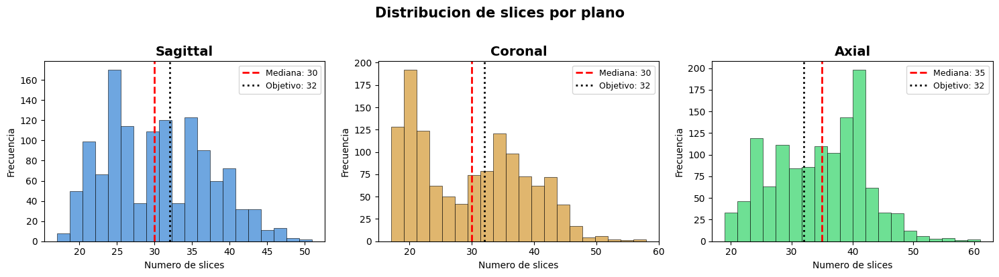

sagittal  : min=17, max=51, media=30.4, mediana=30
coronal   : min=17, max=58, media=29.7, mediana=30
axial     : min=19, max=61, media=34.3, mediana=35

Decision: target_slices=32 (cercano a la mediana de los tres planos).
Los volumenes con mas slices se recortan desde el centro;
los que tienen menos se rellenan con replicacion de bordes (edge padding).


In [7]:
# ---------------------------------------------------------------------------
# 2.2 Distribucion de slices por plano
# Justifica la eleccion de target_slices=32
# ---------------------------------------------------------------------------
slice_counts = {'sagittal': [], 'coronal': [], 'axial': []}

for _, row in all_labels.iterrows():
    for plane in ['sagittal', 'coronal', 'axial']:
        path = os.path.join(DATA_DIR, row['source'], plane, f"{row['case']}.npy")
        if os.path.exists(path):
            vol = np.load(path)
            slice_counts[plane].append(vol.shape[0])

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
colors = ['#4A90D9', '#D9A44A', '#4AD97A']

for i, (plane, counts) in enumerate(slice_counts.items()):
    axes[i].hist(counts, bins=20, color=colors[i], alpha=0.8, edgecolor='black', linewidth=0.5)
    axes[i].axvline(np.median(counts), color='red', linestyle='--', linewidth=2,
                   label=f'Mediana: {np.median(counts):.0f}')
    axes[i].axvline(32, color='black', linestyle=':', linewidth=2,
                   label=f'Objetivo: 32')
    axes[i].set_title(f'{plane.capitalize()}', fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Numero de slices')
    axes[i].set_ylabel('Frecuencia')
    axes[i].legend(fontsize=9)

plt.suptitle('Distribucion de slices por plano', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'eda_slices.png'), dpi=200, bbox_inches='tight')
plt.show()

for plane, counts in slice_counts.items():
    print(f"{plane:10s}: min={min(counts)}, max={max(counts)}, "
          f"media={np.mean(counts):.1f}, mediana={np.median(counts):.0f}")

print(f"\nDecision: target_slices=32 (cercano a la mediana de los tres planos).")
print("Los volumenes con mas slices se recortan desde el centro;")
print("los que tienen menos se rellenan con replicacion de bordes (edge padding).")

In [8]:
# ---------------------------------------------------------------------------
# 2.3 Resolucion original y justificacion del resize
# ---------------------------------------------------------------------------
sample_case = all_labels.iloc[0]
sample_vol = np.load(os.path.join(DATA_DIR, sample_case['source'], 'sagittal', f"{sample_case['case']}.npy"))

print(f"Caso ejemplo: {sample_case['case']}")
print(f"  Shape original sagittal: {sample_vol.shape}")
print(f"  Resolucion por slice: {sample_vol.shape[1]}x{sample_vol.shape[2]}")
print(f"  Tipo de dato: {sample_vol.dtype}")
print(f"  Rango valores: [{sample_vol.min():.2f}, {sample_vol.max():.2f}]")

print(f"\nDecision: resize a {CONFIG['target_size']}x{CONFIG['target_size']}")
print(f"  - Reduce el coste computacional en ~4x respecto a 256x256")
print(f"  - Mantiene resolucion suficiente para estructuras anatomicas principales")
print(f"  - Compatible con batch_size=3 en GPU T4 (16GB VRAM)")

Caso ejemplo: 0000
  Shape original sagittal: (36, 256, 256)
  Resolucion por slice: 256x256
  Tipo de dato: uint8
  Rango valores: [0.00, 255.00]

Decision: resize a 224x224
  - Reduce el coste computacional en ~4x respecto a 256x256
  - Mantiene resolucion suficiente para estructuras anatomicas principales
  - Compatible con batch_size=3 en GPU T4 (16GB VRAM)


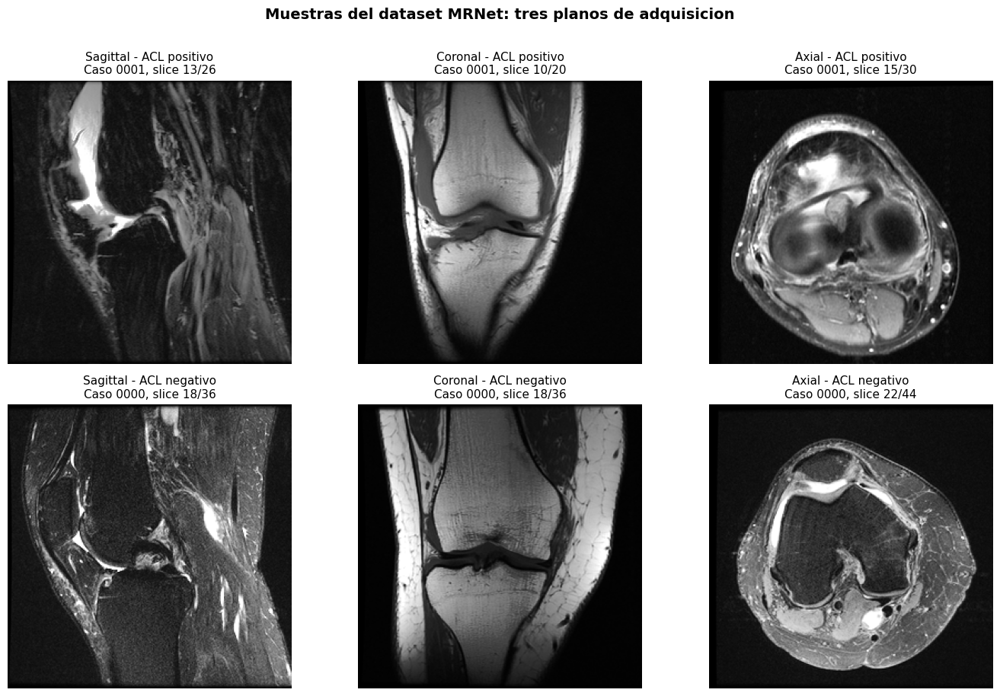

Observaciones:
  - El plano sagittal ofrece la mejor visualizacion del ACL
  - El plano coronal muestra bien los condilos y meniscos
  - El plano axial muestra la seccion transversal de la rodilla
  - Las imagenes son grayscale (1 canal), lo que requiere adaptar
    la primera capa convolucional del backbone (conv1: 3ch -> 1ch)


In [9]:
# ---------------------------------------------------------------------------
# 2.4 Visualizacion de muestras multi-plano
# ---------------------------------------------------------------------------
fig, axes = plt.subplots(2, 3, figsize=(14, 9))

# Un caso ACL+ y un caso ACL-
for row_idx, acl_val in enumerate([1, 0]):
    case = all_labels[all_labels['acl'] == acl_val].iloc[0]
    label_text = 'ACL positivo' if acl_val == 1 else 'ACL negativo'

    for col_idx, plane in enumerate(['sagittal', 'coronal', 'axial']):
        vol = np.load(os.path.join(DATA_DIR, case['source'], plane, f"{case['case']}.npy"))
        mid = vol.shape[0] // 2
        axes[row_idx, col_idx].imshow(vol[mid], cmap='gray')
        axes[row_idx, col_idx].set_title(f"{plane.capitalize()} - {label_text}\n"
                                         f"Caso {case['case']}, slice {mid}/{vol.shape[0]}",
                                         fontsize=11)
        axes[row_idx, col_idx].axis('off')

plt.suptitle('Muestras del dataset MRNet: tres planos de adquisicion',
            fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'eda_muestras.png'), dpi=200, bbox_inches='tight')
plt.show()

print("Observaciones:")
print("  - El plano sagittal ofrece la mejor visualizacion del ACL")
print("  - El plano coronal muestra bien los condilos y meniscos")
print("  - El plano axial muestra la seccion transversal de la rodilla")
print("  - Las imagenes son grayscale (1 canal), lo que requiere adaptar")
print("    la primera capa convolucional del backbone (conv1: 3ch -> 1ch)")

### 2.5 Preprocesamiento avanzado

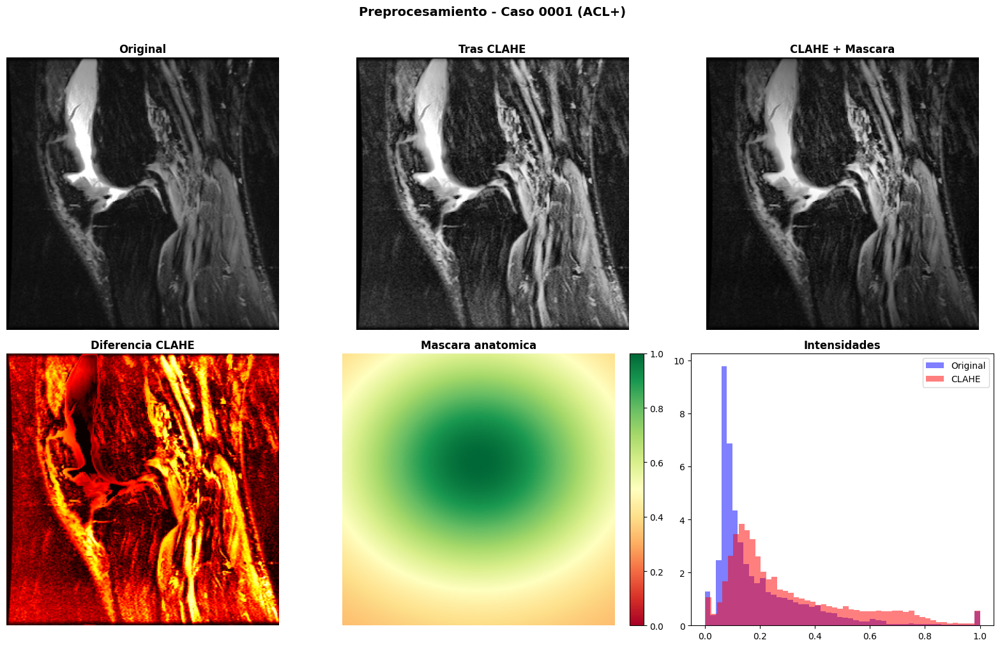

In [10]:
def apply_clahe(image, clip_limit=2.0, grid_size=8):
    img_uint8 = ((image * 255) if image.max() <= 1.0 else image).astype(np.uint8)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=(grid_size, grid_size))
    return clahe.apply(img_uint8).astype(np.float32) / 255.0

def create_anatomical_mask(h, w, cy=0.40, cx=0.50, sy=0.30, sx=0.35, mw=0.3):
    y, x = np.linspace(0,1,h), np.linspace(0,1,w)
    yy, xx = np.meshgrid(y, x, indexing='ij')
    g = np.exp(-((yy-cy)**2/(2*sy**2) + (xx-cx)**2/(2*sx**2)))
    return (g * (1.0 - mw) + mw).astype(np.float32)

case = all_labels[all_labels['acl']==1].iloc[0]
vol = np.load(os.path.join(DATA_DIR, case['source'], 'sagittal', f"{case['case']}.npy"))
mid = vol.shape[0]//2
orig = vol[mid].astype(np.float32)
orig_n = (orig - orig.min()) / (orig.max() - orig.min() + 1e-8)
cl = apply_clahe(orig_n, CONFIG['clahe_clip_limit'], CONFIG['clahe_grid_size'])
mask = create_anatomical_mask(orig.shape[0], orig.shape[1], CONFIG['mask_center_y'], CONFIG['mask_center_x'], CONFIG['mask_sigma_y'], CONFIG['mask_sigma_x'], CONFIG['mask_min_weight'])

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes[0,0].imshow(orig_n, cmap='gray'); axes[0,0].set_title('Original', fontweight='bold'); axes[0,0].axis('off')
axes[0,1].imshow(cl, cmap='gray'); axes[0,1].set_title('Tras CLAHE', fontweight='bold'); axes[0,1].axis('off')
axes[0,2].imshow(cl*mask, cmap='gray'); axes[0,2].set_title('CLAHE + Mascara', fontweight='bold'); axes[0,2].axis('off')
axes[1,0].imshow(np.abs(cl-orig_n), cmap='hot'); axes[1,0].set_title('Diferencia CLAHE', fontweight='bold'); axes[1,0].axis('off')
im=axes[1,1].imshow(mask, cmap='RdYlGn', vmin=0, vmax=1); axes[1,1].set_title('Mascara anatomica', fontweight='bold'); axes[1,1].axis('off'); plt.colorbar(im, ax=axes[1,1], fraction=0.046)
axes[1,2].hist(orig_n.ravel(), bins=50, alpha=0.5, label='Original', color='blue', density=True)
axes[1,2].hist(cl.ravel(), bins=50, alpha=0.5, label='CLAHE', color='red', density=True)
axes[1,2].set_title('Intensidades', fontweight='bold'); axes[1,2].legend()
plt.suptitle(f'Preprocesamiento - Caso {case["case"]} (ACL+)', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'preprocessing.png'), dpi=200, bbox_inches='tight')
plt.show()

## 3. Dataset

In [11]:
class MRNetDataset(Dataset):
    def __init__(self, df, data_dir, cfg, augment=False):
        self.df = df.reset_index(drop=True)
        self.dir = data_dir; self.cfg = cfg; self.augment = augment
        if cfg['mask_enabled']:
            self.mask = create_anatomical_mask(cfg['target_size'], cfg['target_size'],
                cfg['mask_center_y'], cfg['mask_center_x'], cfg['mask_sigma_y'], cfg['mask_sigma_x'], cfg['mask_min_weight'])
        else: self.mask = None
    def __len__(self): return len(self.df)
    def _crop(self, v):
        r = self.cfg['center_crop_ratio']
        if r >= 1.0: return v
        h, w = v.shape[1], v.shape[2]
        ch, cw = int(h*r), int(w*r)
        t, l = (h-ch)//2, (w-cw)//2
        return v[:, t:t+ch, l:l+cw]
    def _clahe(self, v):
        clahe = cv2.createCLAHE(clipLimit=self.cfg['clahe_clip_limit'], tileGridSize=(self.cfg['clahe_grid_size'],)*2)
        return np.stack([clahe.apply(((s*255) if s.max()<=1 else s).astype(np.uint8)).astype(np.float32)/255.0 for s in v])
    def _aug(self, v):
        # Rotacion +-8 grados
        if np.random.rand() > 0.5:
            a = np.random.uniform(-8, 8)
            h, w = v.shape[1], v.shape[2]
            M = cv2.getRotationMatrix2D((w/2, h/2), a, 1.0)
            v = np.stack([cv2.warpAffine(v[i], M, (w, h)) for i in range(v.shape[0])])
        # Brillo
        if np.random.rand() > 0.5:
            v = np.clip(np.random.uniform(0.9, 1.1) * v + np.random.uniform(-0.05, 0.05), 0, 1)
        # Ruido gaussiano
        if np.random.rand() > 0.5:
            v = np.clip(v + np.random.normal(0, 0.01, v.shape), 0, 1)
        # Zoom aleatorio (simula variacion en FOV)
        if np.random.rand() > 0.5:
            scale = np.random.uniform(0.9, 1.1)
            h, w = v.shape[1], v.shape[2]
            nh, nw = int(h * scale), int(w * scale)
            zoomed = np.stack([cv2.resize(v[i], (nw, nh)) for i in range(v.shape[0])])
            if scale > 1.0:
                sh, sw = (nh - h) // 2, (nw - w) // 2
                v = zoomed[:, sh:sh+h, sw:sw+w]
            else:
                pad_h, pad_w = (h - nh) // 2, (w - nw) // 2
                v = np.pad(zoomed, ((0,0), (pad_h, h-nh-pad_h), (pad_w, w-nw-pad_w)), mode='edge')
        # Gaussian blur (simula variacion en calidad de adquisicion)
        if np.random.rand() > 0.3:
            sigma = np.random.uniform(0.3, 0.7)
            v = np.stack([cv2.GaussianBlur(v[i], (0, 0), sigma) for i in range(v.shape[0])])
        # Contraste aleatorio
        if np.random.rand() > 0.5:
            gamma = np.random.uniform(0.8, 1.2)
            v = np.clip(v ** gamma, 0, 1)
        return v.astype(np.float32)
    def _load(self, cid, plane, src):
        v = np.load(os.path.join(self.dir, src, plane, f"{cid}.npy"))
        n, ts = v.shape[0], self.cfg['target_slices']
        if n>=ts: s=(n-ts)//2; v=v[s:s+ts]
        else: pb=(ts-n)//2; pa=ts-n-pb; v=np.pad(v,((pb,pa),(0,0),(0,0)),mode='edge')
        v = self._crop(v)
        sz = self.cfg['target_size']
        v = np.stack([cv2.resize(v[i],(sz,sz)) for i in range(v.shape[0])]).astype(np.float32)
        v = self._clahe(v)
        v = (v-v.min())/(v.max()-v.min()+1e-8)
        if self.mask is not None and plane=='sagittal': v=v*self.mask[np.newaxis,:,:]
        if self.augment: v=self._aug(v)
        return v
    def __getitem__(self, idx):
        r = self.df.iloc[idx]
        sag=torch.from_numpy(self._load(r['case'],'sagittal',r['source'])).unsqueeze(0).float()
        cor=torch.from_numpy(self._load(r['case'],'coronal',r['source'])).unsqueeze(0).float()
        axi=torch.from_numpy(self._load(r['case'],'axial',r['source'])).unsqueeze(0).float()
        labels=torch.tensor([r['abnormal'],r['acl'],r['meniscus']],dtype=torch.float32)
        return (sag,cor,axi), labels
def make_ds(df, augment=False): return MRNetDataset(df, DATA_DIR, CONFIG, augment)
print("Dataset preparado.")

Dataset preparado.


## 4. Arquitectura: CASCADE con Attention Pooling

El attention pooling reemplaza max pooling con una media ponderada aprendida. Una capa lineal asigna pesos de importancia a cada slice; softmax normaliza los pesos; la media ponderada integra informacion de todos los slices relevantes.

In [12]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0):
        super().__init__(); self.alpha=alpha; self.gamma=gamma
    def forward(self, inp, tgt):
        bce=F.binary_cross_entropy_with_logits(inp,tgt,reduction='none')
        pt=tgt*torch.sigmoid(inp)+(1-tgt)*(1-torch.sigmoid(inp))
        at=tgt*self.alpha+(1-tgt)*(1-self.alpha)
        return (at*(1-pt)**self.gamma*bce).mean()

class WeightedBCE(nn.Module):
    def __init__(self, pw=2.0):
        super().__init__(); self.pw=pw
    def forward(self, p, t):
        p=p.clamp(1e-7,1-1e-7); w=t*self.pw+(1-t)
        return (w*(-(t*torch.log(p)+(1-t)*torch.log(1-p)))).mean()

class AttentionPool(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.attn = nn.Sequential(nn.Linear(dim, 64), nn.Tanh(), nn.Linear(64, 1))
    def forward(self, x):
        w = torch.softmax(self.attn(x).squeeze(-1), dim=1)
        return (x * w.unsqueeze(-1)).sum(dim=1), w

def get_target_layer(model, backbone):
    if backbone in ['resnet18', 'resnet50']:
        return model.layer4[-1]
    else:
        return model.features[-1]

class CASCADEMultiPlane(nn.Module):
    def __init__(self, acl_w=[0.55,0.35,0.1], men_w=[0.30,0.55,0.15], drop=0.5,
                 backbone='resnet18'):
        super().__init__()
        self.backbone_name = backbone
        self.p1_sag=self._bb(1,drop,backbone); self.p1_cor=self._bb(1,drop,backbone); self.p1_axi=self._bb(1,drop,backbone)
        self.p1_as=AttentionPool(1); self.p1_ac=AttentionPool(1); self.p1_aa=AttentionPool(1)
        self.p2_sag=self._bb(2,drop,backbone); self.p2_cor=self._bb(2,drop,backbone); self.p2_axi=self._bb(2,drop,backbone)
        self.p2_as=AttentionPool(2); self.p2_ac=AttentionPool(2); self.p2_aa=AttentionPool(2)
        self.acl_w=torch.tensor(acl_w,dtype=torch.float32)
        self.men_w=torch.tensor(men_w,dtype=torch.float32)

    def _bb(self, nc, drop=0.5, backbone='resnet18'):
        if backbone == 'resnet18':
            m = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
            m.conv1 = nn.Conv2d(1,64,kernel_size=7,stride=2,padding=3,bias=False)
            m.fc = nn.Sequential(nn.Dropout(drop), nn.Linear(512, nc))
        elif backbone == 'resnet50':
            m = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
            m.conv1 = nn.Conv2d(1,64,kernel_size=7,stride=2,padding=3,bias=False)
            m.fc = nn.Sequential(nn.Dropout(drop), nn.Linear(2048, nc))
        elif backbone == 'efficientnet':
            m = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
            m.features[0][0] = nn.Conv2d(1,32,kernel_size=3,stride=2,padding=1,bias=False)
            m.classifier = nn.Sequential(nn.Dropout(drop), nn.Linear(1280, nc))
        return m

    def _proc(self, vol, bb, ap):
        B,_,S,H,W = vol.shape
        out = bb(vol.view(B*S,1,H,W)).view(B,S,-1)
        return ap(out)

    def forward(self, sag, cor, axi, phase=2, return_individual=False):
        if phase==1:
            os_,ws=self._proc(sag,self.p1_sag,self.p1_as)
            oc,wc=self._proc(cor,self.p1_cor,self.p1_ac)
            oa,wa=self._proc(axi,self.p1_axi,self.p1_aa)
            f=(os_+oc+oa)/3.0
            if return_individual: return {'sagittal':os_,'coronal':oc,'axial':oa,'fused':f,'attn_sag':ws,'attn_cor':wc,'attn_axi':wa}
            return f

        os_,ws=self._proc(sag,self.p2_sag,self.p2_as)
        oc,wc=self._proc(cor,self.p2_cor,self.p2_ac)
        oa,wa=self._proc(axi,self.p2_axi,self.p2_aa)
        aw=self.acl_w.to(os_.device); mw=self.men_w.to(os_.device)
        ap=torch.sigmoid(torch.stack([os_[:,0],oc[:,0],oa[:,0]],dim=1))
        mp=torch.sigmoid(torch.stack([os_[:,1],oc[:,1],oa[:,1]],dim=1))
        fused=torch.cat([(aw*ap).sum(1,keepdim=True),(mw*mp).sum(1,keepdim=True)],dim=1)
        if return_individual:
            return {'sagittal':os_,'coronal':oc,'axial':oa,'fused':fused,
                    'acl_weights':aw.cpu().numpy(),'meniscus_weights':mw.cpu().numpy(),
                    'attn_sag':ws,'attn_cor':wc,'attn_axi':wa}
        return fused

    def get_attention_weights(self, sag, cor, axi):
        self.eval()
        with torch.no_grad():
            _,ws=self._proc(sag,self.p2_sag,self.p2_as)
            _,wc=self._proc(cor,self.p2_cor,self.p2_ac)
            _,wa=self._proc(axi,self.p2_axi,self.p2_aa)
        return {'sagittal':ws[0].cpu().numpy(),'coronal':wc[0].cpu().numpy(),'axial':wa[0].cpu().numpy()}

    def get_top_slices(self, sag, cor, axi, top_k=3):
        attn = self.get_attention_weights(sag, cor, axi)
        return {pn: np.argsort(aw)[-top_k:][::-1].tolist() for pn, aw in attn.items()}

backbone = CONFIG.get('backbone', 'resnet18')
_m = CASCADEMultiPlane(CONFIG['acl_weights'], CONFIG['meniscus_weights'], backbone=backbone)
total = sum(p.numel() for p in _m.parameters())
print(f"Backbone: {backbone}")
print(f"Parametros: {total/1e6:.1f}M")
del _m

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 183MB/s]


Backbone: resnet18
Parametros: 67.0M


## 5. Entrenamiento

In [13]:
def train_phase(model, train_loader, val_loader, phase, epochs=25, patience=7):
    model.to(device)
    if phase==1:
        params=list(model.p1_sag.parameters())+list(model.p1_cor.parameters())+list(model.p1_axi.parameters())+list(model.p1_as.parameters())+list(model.p1_ac.parameters())+list(model.p1_aa.parameters())
        criterion=FocalLoss(0.25,2.0); label_idx=0
        print(f"\n--- Fase 1: Deteccion de anomalias ---")
    else:
        for p in list(model.p1_sag.parameters())+list(model.p1_cor.parameters())+list(model.p1_axi.parameters())+list(model.p1_as.parameters())+list(model.p1_ac.parameters())+list(model.p1_aa.parameters()):
            p.requires_grad=False
        tr=0; tot=0
        for pm in [model.p2_sag,model.p2_cor,model.p2_axi]:
            for n,p in pm.named_parameters():
                tot+=p.numel()
                bb = CONFIG.get('backbone', 'resnet18')
                if bb in ['resnet18', 'resnet50']:
                    trainable = 'layer4' in n or 'fc' in n
                else:
                    trainable = 'features.8' in n or 'features.7' in n or 'classifier' in n
                if trainable: p.requires_grad=True; tr+=p.numel()
                else: p.requires_grad=False
        for ap in [model.p2_as,model.p2_ac,model.p2_aa]:
            for p in ap.parameters(): tr+=p.numel(); tot+=p.numel()
        params=[p for p in model.parameters() if p.requires_grad]
        criterion=WeightedBCE(CONFIG['phase2_pos_weight']); label_idx=[1,2]
        print(f"\n--- Fase 2: ACL/Menisco (pw={CONFIG['phase2_pos_weight']}) ---")
        print(f"    Params: {tr/1e6:.1f}M / {tot/1e6:.1f}M")
    opt=optim.Adam(params,lr=CONFIG['learning_rate'],weight_decay=1e-4)
    sched=optim.lr_scheduler.ReduceLROnPlateau(opt,mode='min',patience=3,factor=0.5)
    best_v,pc,best_s=float('inf'),0,None
    train_losses, val_losses = [], []
    for ep in range(epochs):
        model.train(); tl=0.0
        for (s,c,a),lb in train_loader:
            s,c,a=s.to(device),c.to(device),a.to(device); lb=lb.to(device)
            opt.zero_grad(); o=model(s,c,a,phase=phase)
            t=lb[:,label_idx:label_idx+1] if phase==1 else lb[:,label_idx]
            l=criterion(o,t); l.backward(); opt.step(); tl+=l.item()
        tl/=len(train_loader)
        model.eval(); vl=0.0
        with torch.no_grad():
            for (s,c,a),lb in val_loader:
                s,c,a=s.to(device),c.to(device),a.to(device); lb=lb.to(device)
                o=model(s,c,a,phase=phase)
                t=lb[:,label_idx:label_idx+1] if phase==1 else lb[:,label_idx]
                vl+=criterion(o,t).item()
        vl/=len(val_loader)
        train_losses.append(tl)
        val_losses.append(vl)
        sched.step(vl); lr=opt.param_groups[0]['lr']
        if vl<best_v:
            print(f"  Ep {ep+1:2d}/{epochs} | Train: {tl:.4f} | Val: {vl:.4f} | LR: {lr:.1e} *")
            best_v=vl; pc=0; best_s=copy.deepcopy(model.state_dict())
        else:
            pc+=1; print(f"  Ep {ep+1:2d}/{epochs} | Train: {tl:.4f} | Val: {vl:.4f} | LR: {lr:.1e} ({pc}/{patience})")
        if pc>=patience: print(f"  Early stopping ep {ep+1}"); break
    if best_s is None: best_s=copy.deepcopy(model.state_dict())
    model.load_state_dict(best_s); print(f"  Best val: {best_v:.4f}")
    return model, {'train_loss': train_losses, 'val_loss': val_losses}
print("Training definido.")

Training definido.


In [14]:
def find_clinical_threshold(model, train_loader, val_loader, target_sens=0.80):
    """
    Calcula tres thresholds y selecciona el clinico desde validacion.

    - F1-optimal: maximiza F1
    - Youden: maximiza Sens + Spec - 1
    - Clinico: maxima Spec tal que Sens >= target_sens
    """
    model.eval()

    def _collect(loader):
        ps, ls = [], []
        with torch.no_grad():
            for (sag, cor, axi), labels in loader:
                sag, cor, axi = sag.to(device), cor.to(device), axi.to(device)
                out = model(sag, cor, axi, phase=2)
                ps.extend(out[:, 0].cpu().numpy())
                ls.extend(labels[:, 1].numpy())
        return np.array(ps), np.array(ls)

    def _best_thresholds(probs, labels, name):
        pos_p = probs[labels == 1]
        neg_p = probs[labels == 0]
        print(f"  {name} (n={len(labels)}, ACL+={int(labels.sum())}): "
              f"ACL+ mean={pos_p.mean():.3f}, ACL- mean={neg_p.mean():.3f}, "
              f"sep={pos_p.mean()-neg_p.mean():.3f}")

        best = {'f1': (0.5, 0), 'youden': (0.5, -1), 'clinical': (0.5, 0)}
        for thr in np.arange(0.05, 0.95, 0.01):
            pred = (probs >= thr).astype(int)
            sens = recall_score(labels, pred, zero_division=0)
            spec = recall_score(1-labels, 1-pred, zero_division=0)
            f1 = f1_score(labels, pred, zero_division=0)
            if f1 > best['f1'][1]: best['f1'] = (thr, f1)
            if sens+spec-1 > best['youden'][1]: best['youden'] = (thr, sens+spec-1)
            if sens >= target_sens and spec > best['clinical'][1]: best['clinical'] = (thr, spec)

        for k in ['f1', 'youden', 'clinical']:
            t = best[k][0]
            pred = (probs >= t).astype(int)
            s = recall_score(labels, pred, zero_division=0)
            sp = recall_score(1-labels, 1-pred, zero_division=0)
            f = f1_score(labels, pred, zero_division=0)
            tag = " <-- seleccionado" if k == 'clinical' else ""
            print(f"    {k:10s} thr={t:.3f}: Sens={s*100:.1f}% Spec={sp*100:.1f}% F1={f:.3f}{tag}")
        return best

    print("\nOptimizacion de threshold:")
    t_probs, t_labels = _collect(train_loader)
    train_best = _best_thresholds(t_probs, t_labels, "TRAIN")

    v_probs, v_labels = _collect(val_loader)
    val_best = _best_thresholds(v_probs, v_labels, "VALID")

    # Usar threshold clinico de VALIDACION (menos sobreconfiado que train)
    selected = val_best['clinical'][0]
    print(f"\n  Threshold seleccionado: {selected:.3f} (de validacion, Sens >= {target_sens*100:.0f}%)")

    return selected, {'train': train_best, 'val': val_best}


def evaluate(model, loader, threshold=0.5):
    model.eval()
    all_p, all_l = [], []
    with torch.no_grad():
        for (sag, cor, axi), labels in tqdm(loader, desc="  Evaluando"):
            sag, cor, axi = sag.to(device), cor.to(device), axi.to(device)
            all_p.append(model(sag, cor, axi, phase=2).cpu().numpy())
            all_l.append(labels[:, [1, 2]].numpy())
    all_p, all_l = np.vstack(all_p), np.vstack(all_l)

    y_true, y_prob = all_l[:, 0], all_p[:, 0]
    y_pred = (y_prob >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sens = tp / (tp+fn) if (tp+fn) > 0 else 0
    spec = tn / (tn+fp) if (tn+fp) > 0 else 0
    f1 = f1_score(y_true, y_pred, zero_division=0)
    roc_auc = auc(*roc_curve(y_true, y_prob)[:2]) if len(np.unique(y_true)) > 1 else 0

    print(f"  Test (thr={threshold:.3f}): Sens={sens*100:.1f}% Spec={spec*100:.1f}% "
          f"F1={f1:.3f} AUC={roc_auc:.3f} | TP={tp} FN={fn} FP={fp} TN={tn}")
    return {'sens': sens, 'spec': spec, 'f1': f1, 'auc': roc_auc,
            'tp': int(tp), 'tn': int(tn), 'fp': int(fp), 'fn': int(fn),
            'probs': y_prob, 'labels': y_true}

print("Funciones de evaluacion definidas.")

Funciones de evaluacion definidas.


## 6. Validacion cruzada 5-fold

In [15]:
print("="*70)
print("5-FOLD CV (Attention Pooling + CLAHE)")
print("="*70)
skf=StratifiedKFold(n_splits=CONFIG['n_folds'],shuffle=True,random_state=CONFIG['random_seed'])
results=[]; best_models=[]; all_histories=[]
for fold,(tv_idx,test_idx) in enumerate(skf.split(all_labels,all_labels['acl']),1):
    print(f"\n{'='*70}\nFold {fold}/{CONFIG['n_folds']}\n{'='*70}")
    tv=all_labels.iloc[tv_idx].reset_index(drop=True)
    te=all_labels.iloc[test_idx].reset_index(drop=True)
    vi=tv.groupby('acl',group_keys=False).apply(lambda x:x.sample(frac=CONFIG['validation_ratio'],random_state=42)).index
    va=tv.loc[vi].reset_index(drop=True); tr=tv.drop(vi).reset_index(drop=True)
    print(f"Train:{len(tr)} Val:{len(va)} Test:{len(te)} ACL+:{tr['acl'].sum()}/{va['acl'].sum()}/{te['acl'].sum()}")
    dl_tr=DataLoader(make_ds(tr,True),batch_size=CONFIG['batch_size'],shuffle=True,num_workers=2,pin_memory=True)
    dl_va=DataLoader(make_ds(va),batch_size=CONFIG['batch_size'],shuffle=False,num_workers=2,pin_memory=True)
    dl_te=DataLoader(make_ds(te),batch_size=CONFIG['batch_size'],shuffle=False,num_workers=2,pin_memory=True)
    model=CASCADEMultiPlane(CONFIG['acl_weights'],CONFIG['meniscus_weights'],
                            backbone=CONFIG.get('backbone','resnet18'))
    model, p1_hist=train_phase(model,dl_tr,dl_va,phase=1,epochs=CONFIG['max_epochs'],patience=CONFIG['patience'])
    model, p2_hist=train_phase(model,dl_tr,dl_va,phase=2,epochs=CONFIG['max_epochs'],patience=CONFIG['patience'])
    thr,_=find_clinical_threshold(model,dl_tr,dl_va,CONFIG['target_sensitivity'])
    m=evaluate(model,dl_te,threshold=thr); m['threshold']=thr; results.append(m)
    torch.save(model.state_dict(),os.path.join(SAVE_DIR,'models',f'fold{fold}.pth'))
    best_models.append((fold,model.cpu(),thr,te))
    all_histories.append({'fold': fold, 'p1': p1_hist, 'p2': p2_hist})
    del dl_tr,dl_va,dl_te; torch.cuda.empty_cache(); gc.collect()
    print(f"Fold {fold} completado.")
print(f"\n{'='*70}\n5-Fold CV completado.\n{'='*70}")

5-FOLD CV (Attention Pooling + CLAHE)

Fold 1/5
Train:800 Val:200 Test:250 ACL+:168/42/52

--- Fase 1: Deteccion de anomalias ---
  Ep  1/25 | Train: 0.0598 | Val: 0.0693 | LR: 1.0e-04 *
  Ep  2/25 | Train: 0.0500 | Val: 0.0433 | LR: 1.0e-04 *
  Ep  3/25 | Train: 0.0457 | Val: 0.0409 | LR: 1.0e-04 *
  Ep  4/25 | Train: 0.0443 | Val: 0.0529 | LR: 1.0e-04 (1/7)
  Ep  5/25 | Train: 0.0422 | Val: 0.1928 | LR: 1.0e-04 (2/7)
  Ep  6/25 | Train: 0.0446 | Val: 0.0701 | LR: 1.0e-04 (3/7)
  Ep  7/25 | Train: 0.0400 | Val: 0.0404 | LR: 1.0e-04 *
  Ep  8/25 | Train: 0.0400 | Val: 0.1431 | LR: 1.0e-04 (1/7)
  Ep  9/25 | Train: 0.0367 | Val: 0.0416 | LR: 1.0e-04 (2/7)
  Ep 10/25 | Train: 0.0368 | Val: 0.0396 | LR: 1.0e-04 *
  Ep 11/25 | Train: 0.0360 | Val: 0.0514 | LR: 1.0e-04 (1/7)
  Ep 12/25 | Train: 0.0311 | Val: 0.1162 | LR: 1.0e-04 (2/7)
  Ep 13/25 | Train: 0.0314 | Val: 0.0414 | LR: 1.0e-04 (3/7)
  Ep 14/25 | Train: 0.0322 | Val: 0.0423 | LR: 5.0e-05 (4/7)
  Ep 15/25 | Train: 0.0240 | Val: 0.

  Evaluando: 100%|██████████| 125/125 [00:21<00:00,  5.70it/s]


  Test (thr=0.210): Sens=86.5% Spec=46.0% F1=0.441 AUC=0.826 | TP=45 FN=7 FP=107 TN=91
Fold 1 completado.

Fold 2/5
Train:800 Val:200 Test:250 ACL+:168/42/52

--- Fase 1: Deteccion de anomalias ---
  Ep  1/25 | Train: 0.0602 | Val: 0.1005 | LR: 1.0e-04 *
  Ep  2/25 | Train: 0.0521 | Val: 0.0596 | LR: 1.0e-04 *
  Ep  3/25 | Train: 0.0495 | Val: 0.0460 | LR: 1.0e-04 *
  Ep  4/25 | Train: 0.0435 | Val: 0.0923 | LR: 1.0e-04 (1/7)
  Ep  5/25 | Train: 0.0440 | Val: 0.0523 | LR: 1.0e-04 (2/7)
  Ep  6/25 | Train: 0.0405 | Val: 0.0475 | LR: 1.0e-04 (3/7)
  Ep  7/25 | Train: 0.0379 | Val: 0.0625 | LR: 5.0e-05 (4/7)
  Ep  8/25 | Train: 0.0329 | Val: 0.0457 | LR: 5.0e-05 *
  Ep  9/25 | Train: 0.0293 | Val: 0.0475 | LR: 5.0e-05 (1/7)
  Ep 10/25 | Train: 0.0278 | Val: 0.0430 | LR: 5.0e-05 *
  Ep 11/25 | Train: 0.0237 | Val: 0.0619 | LR: 5.0e-05 (1/7)
  Ep 12/25 | Train: 0.0248 | Val: 0.0528 | LR: 5.0e-05 (2/7)
  Ep 13/25 | Train: 0.0192 | Val: 0.0694 | LR: 5.0e-05 (3/7)
  Ep 14/25 | Train: 0.0184 | 

  Evaluando: 100%|██████████| 125/125 [00:21<00:00,  5.69it/s]


  Test (thr=0.270): Sens=88.5% Spec=64.6% F1=0.548 AUC=0.857 | TP=46 FN=6 FP=70 TN=128
Fold 2 completado.

Fold 3/5
Train:800 Val:200 Test:250 ACL+:168/42/52

--- Fase 1: Deteccion de anomalias ---
  Ep  1/25 | Train: 0.0617 | Val: 0.0588 | LR: 1.0e-04 *
  Ep  2/25 | Train: 0.0530 | Val: 0.1177 | LR: 1.0e-04 (1/7)
  Ep  3/25 | Train: 0.0503 | Val: 0.0628 | LR: 1.0e-04 (2/7)
  Ep  4/25 | Train: 0.0459 | Val: 0.0474 | LR: 1.0e-04 *
  Ep  5/25 | Train: 0.0458 | Val: 0.0591 | LR: 1.0e-04 (1/7)
  Ep  6/25 | Train: 0.0424 | Val: 0.0432 | LR: 1.0e-04 *
  Ep  7/25 | Train: 0.0431 | Val: 0.0850 | LR: 1.0e-04 (1/7)
  Ep  8/25 | Train: 0.0415 | Val: 0.0479 | LR: 1.0e-04 (2/7)
  Ep  9/25 | Train: 0.0394 | Val: 0.0824 | LR: 1.0e-04 (3/7)
  Ep 10/25 | Train: 0.0388 | Val: 0.0472 | LR: 5.0e-05 (4/7)
  Ep 11/25 | Train: 0.0363 | Val: 0.0708 | LR: 5.0e-05 (5/7)
  Ep 12/25 | Train: 0.0332 | Val: 0.0483 | LR: 5.0e-05 (6/7)
  Ep 13/25 | Train: 0.0315 | Val: 0.0590 | LR: 5.0e-05 (7/7)
  Early stopping ep 1

  Evaluando: 100%|██████████| 125/125 [00:21<00:00,  5.71it/s]


  Test (thr=0.390): Sens=73.1% Spec=73.2% F1=0.531 AUC=0.812 | TP=38 FN=14 FP=53 TN=145
Fold 3 completado.

Fold 4/5
Train:800 Val:200 Test:250 ACL+:167/42/53

--- Fase 1: Deteccion de anomalias ---
  Ep  1/25 | Train: 0.0615 | Val: 0.0541 | LR: 1.0e-04 *
  Ep  2/25 | Train: 0.0534 | Val: 0.0588 | LR: 1.0e-04 (1/7)
  Ep  3/25 | Train: 0.0495 | Val: 0.0564 | LR: 1.0e-04 (2/7)
  Ep  4/25 | Train: 0.0451 | Val: 0.0557 | LR: 1.0e-04 (3/7)
  Ep  5/25 | Train: 0.0457 | Val: 0.0431 | LR: 1.0e-04 *
  Ep  6/25 | Train: 0.0433 | Val: 0.0526 | LR: 1.0e-04 (1/7)
  Ep  7/25 | Train: 0.0406 | Val: 0.0949 | LR: 1.0e-04 (2/7)
  Ep  8/25 | Train: 0.0437 | Val: 0.0423 | LR: 1.0e-04 *
  Ep  9/25 | Train: 0.0392 | Val: 0.0421 | LR: 1.0e-04 *
  Ep 10/25 | Train: 0.0385 | Val: 0.0358 | LR: 1.0e-04 *
  Ep 11/25 | Train: 0.0395 | Val: 0.0505 | LR: 1.0e-04 (1/7)
  Ep 12/25 | Train: 0.0386 | Val: 0.0491 | LR: 1.0e-04 (2/7)
  Ep 13/25 | Train: 0.0376 | Val: 0.0447 | LR: 1.0e-04 (3/7)
  Ep 14/25 | Train: 0.0377 |

  Evaluando: 100%|██████████| 125/125 [00:22<00:00,  5.64it/s]


  Test (thr=0.330): Sens=86.8% Spec=70.6% F1=0.586 AUC=0.870 | TP=46 FN=7 FP=58 TN=139
Fold 4 completado.

Fold 5/5
Train:800 Val:200 Test:250 ACL+:167/42/53

--- Fase 1: Deteccion de anomalias ---
  Ep  1/25 | Train: 0.0638 | Val: 0.0754 | LR: 1.0e-04 *
  Ep  2/25 | Train: 0.0525 | Val: 0.0496 | LR: 1.0e-04 *
  Ep  3/25 | Train: 0.0455 | Val: 0.0525 | LR: 1.0e-04 (1/7)
  Ep  4/25 | Train: 0.0439 | Val: 0.0479 | LR: 1.0e-04 *
  Ep  5/25 | Train: 0.0419 | Val: 0.0456 | LR: 1.0e-04 *
  Ep  6/25 | Train: 0.0380 | Val: 0.0478 | LR: 1.0e-04 (1/7)
  Ep  7/25 | Train: 0.0334 | Val: 0.0509 | LR: 1.0e-04 (2/7)
  Ep  8/25 | Train: 0.0353 | Val: 0.0496 | LR: 1.0e-04 (3/7)
  Ep  9/25 | Train: 0.0332 | Val: 0.0453 | LR: 1.0e-04 *
  Ep 10/25 | Train: 0.0316 | Val: 0.0450 | LR: 1.0e-04 *
  Ep 11/25 | Train: 0.0309 | Val: 0.0478 | LR: 1.0e-04 (1/7)
  Ep 12/25 | Train: 0.0344 | Val: 0.3514 | LR: 1.0e-04 (2/7)
  Ep 13/25 | Train: 0.0310 | Val: 0.1057 | LR: 1.0e-04 (3/7)
  Ep 14/25 | Train: 0.0255 | Val:

  Evaluando: 100%|██████████| 125/125 [00:21<00:00,  5.69it/s]


  Test (thr=0.260): Sens=88.7% Spec=65.5% F1=0.560 AUC=0.824 | TP=47 FN=6 FP=68 TN=129
Fold 5 completado.

5-Fold CV completado.



RESULTADOS AGREGADOS

Por fold:
  Fold 1: Sens=86.5% Spec=46.0% F1=0.441 AUC=0.826 Thr=0.210
  Fold 2: Sens=88.5% Spec=64.6% F1=0.548 AUC=0.857 Thr=0.270
  Fold 3: Sens=73.1% Spec=73.2% F1=0.531 AUC=0.812 Thr=0.390
  Fold 4: Sens=86.8% Spec=70.6% F1=0.586 AUC=0.870 Thr=0.330
  Fold 5: Sens=88.7% Spec=65.5% F1=0.560 AUC=0.824 Thr=0.260

Media +/- Std:
  Sensitivity: 84.7% +/- 5.9%
  Specificity: 64.0% +/- 9.6%
  F1-Score:    0.533 +/- 0.049
  AUC:         0.838 +/- 0.022
  Threshold:   0.292 +/- 0.062


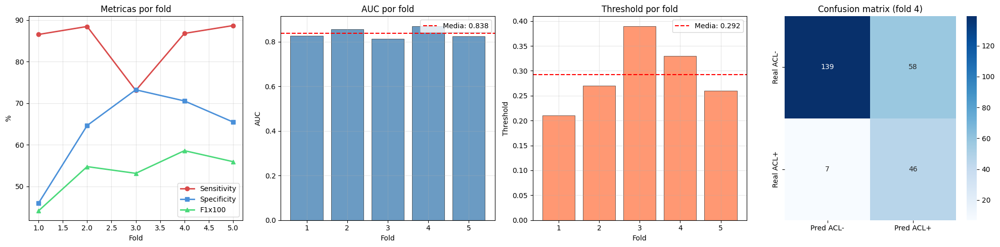

In [16]:
# Resultados agregados
sens_s = [r['sens'] for r in results]
spec_s = [r['spec'] for r in results]
f1_s = [r['f1'] for r in results]
auc_s = [r['auc'] for r in results]
thr_s = [r['threshold'] for r in results]

print("\n" + "="*70)
print("RESULTADOS AGREGADOS")
print("="*70)
print(f"\nPor fold:")
for i, r in enumerate(results, 1):
    print(f"  Fold {i}: Sens={r['sens']*100:.1f}% Spec={r['spec']*100:.1f}% "
          f"F1={r['f1']:.3f} AUC={r['auc']:.3f} Thr={r['threshold']:.3f}")

print(f"\nMedia +/- Std:")
print(f"  Sensitivity: {np.mean(sens_s)*100:.1f}% +/- {np.std(sens_s)*100:.1f}%")
print(f"  Specificity: {np.mean(spec_s)*100:.1f}% +/- {np.std(spec_s)*100:.1f}%")
print(f"  F1-Score:    {np.mean(f1_s):.3f} +/- {np.std(f1_s):.3f}")
print(f"  AUC:         {np.mean(auc_s):.3f} +/- {np.std(auc_s):.3f}")
print(f"  Threshold:   {np.mean(thr_s):.3f} +/- {np.std(thr_s):.3f}")

# Graficos
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

x = range(1, len(results)+1)
axes[0].plot(x, [r['sens']*100 for r in results], 'o-', label='Sensitivity', c='#D94A4A', lw=2)
axes[0].plot(x, [r['spec']*100 for r in results], 's-', label='Specificity', c='#4A90D9', lw=2)
axes[0].plot(x, [r['f1']*100 for r in results], '^-', label='F1x100', c='#4AD97A', lw=2)
axes[0].set_xlabel('Fold'); axes[0].set_ylabel('%'); axes[0].set_title('Metricas por fold')
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].bar(x, auc_s, color='steelblue', alpha=0.8, edgecolor='black', lw=0.5)
axes[1].axhline(np.mean(auc_s), color='red', ls='--', label=f'Media: {np.mean(auc_s):.3f}')
axes[1].set_xlabel('Fold'); axes[1].set_ylabel('AUC'); axes[1].set_title('AUC por fold')
axes[1].legend(); axes[1].grid(alpha=0.3)

axes[2].bar(x, thr_s, color='coral', alpha=0.8, edgecolor='black', lw=0.5)
axes[2].axhline(np.mean(thr_s), color='red', ls='--', label=f'Media: {np.mean(thr_s):.3f}')
axes[2].set_xlabel('Fold'); axes[2].set_ylabel('Threshold'); axes[2].set_title('Threshold por fold')
axes[2].legend(); axes[2].grid(alpha=0.3)

bi = np.argmax(f1_s)
cm = np.array([[results[bi]['tn'], results[bi]['fp']],
               [results[bi]['fn'], results[bi]['tp']]])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[3],
           xticklabels=['Pred ACL-', 'Pred ACL+'], yticklabels=['Real ACL-', 'Real ACL+'])
axes[3].set_title(f'Confusion matrix (fold {bi+1})')

plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'resultados.png'), dpi=200, bbox_inches='tight')
plt.show()

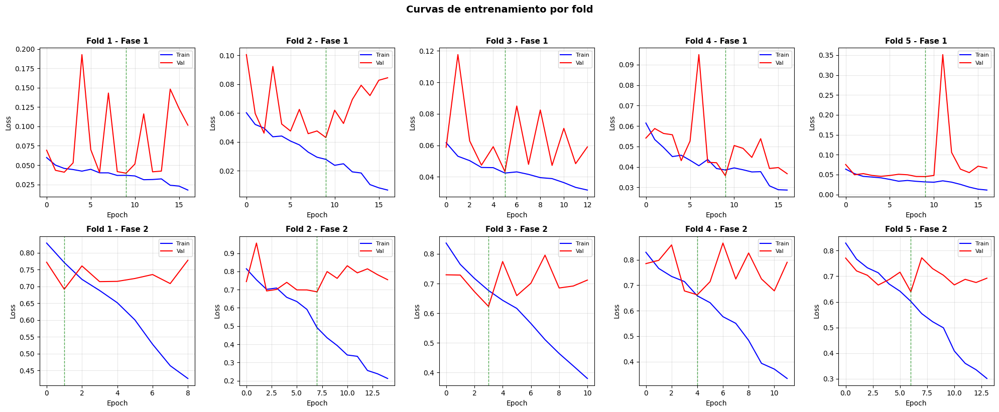

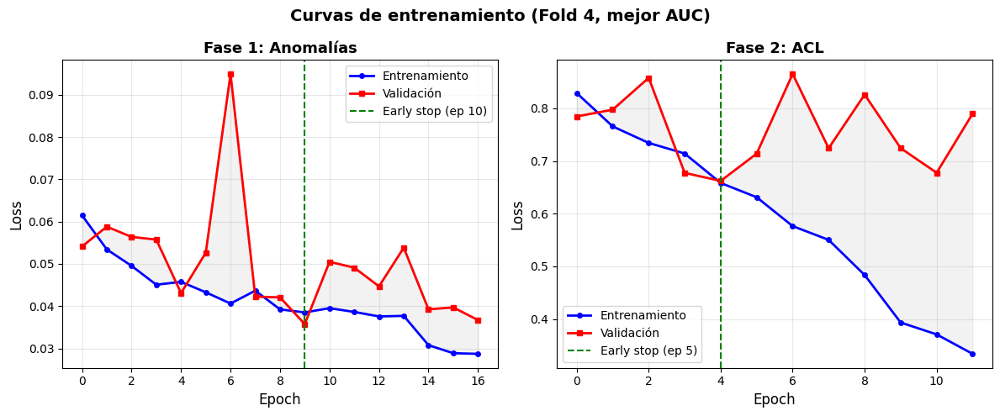

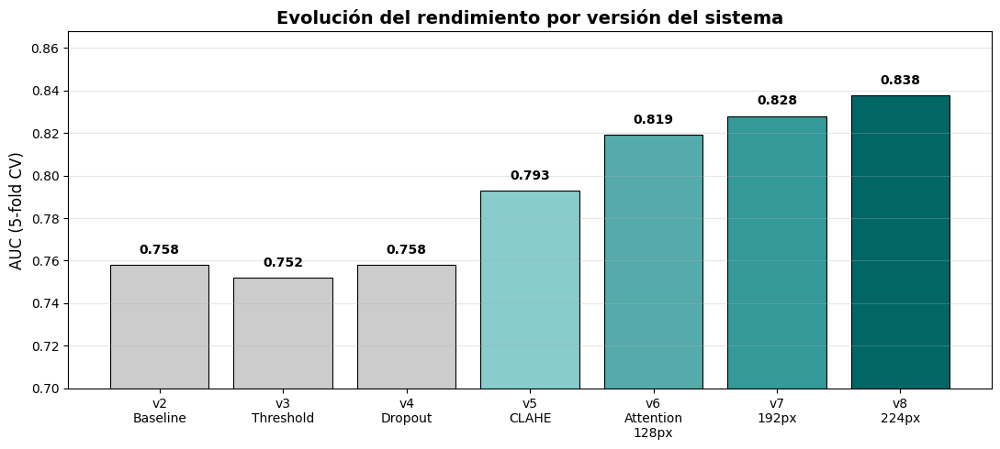

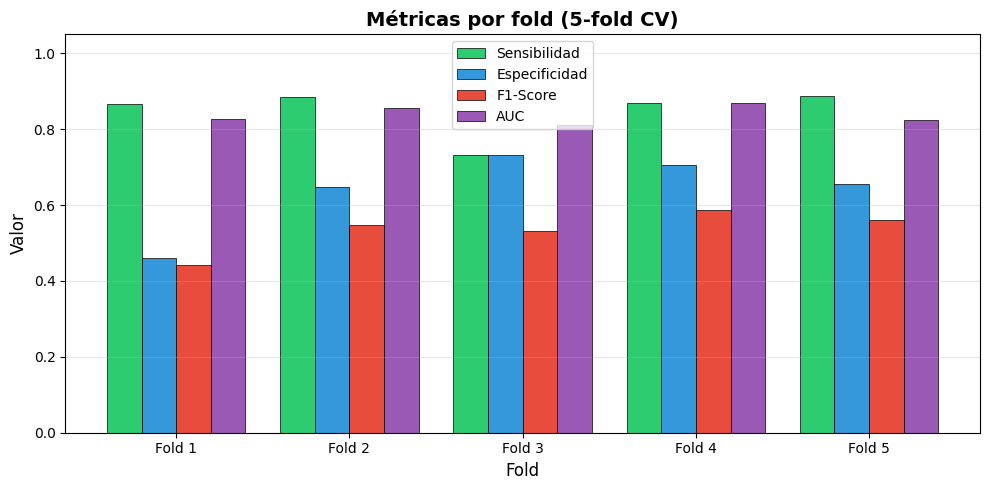

Graficas guardadas en /kaggle/working/TFG_FINAL/figures


In [17]:
# ================================================================
# GRAFICAS PARA LA MEMORIA
# ================================================================

# 1. Curvas de entrenamiento (todos los folds)
fig, axes = plt.subplots(2, CONFIG['n_folds'], figsize=(4*CONFIG['n_folds'], 8))
for i, h in enumerate(all_histories):
    # Phase 1
    axes[0, i].plot(h['p1']['train_loss'], 'b-', lw=1.5, label='Train')
    axes[0, i].plot(h['p1']['val_loss'], 'r-', lw=1.5, label='Val')
    best_ep = np.argmin(h['p1']['val_loss'])
    axes[0, i].axvline(best_ep, color='green', ls='--', lw=1, alpha=0.7)
    axes[0, i].set_title(f'Fold {h["fold"]} - Fase 1', fontsize=11, fontweight='bold')
    axes[0, i].set_xlabel('Epoch')
    axes[0, i].set_ylabel('Loss')
    axes[0, i].legend(fontsize=8)
    axes[0, i].grid(alpha=0.3)
    # Phase 2
    axes[1, i].plot(h['p2']['train_loss'], 'b-', lw=1.5, label='Train')
    axes[1, i].plot(h['p2']['val_loss'], 'r-', lw=1.5, label='Val')
    best_ep2 = np.argmin(h['p2']['val_loss'])
    axes[1, i].axvline(best_ep2, color='green', ls='--', lw=1, alpha=0.7)
    axes[1, i].set_title(f'Fold {h["fold"]} - Fase 2', fontsize=11, fontweight='bold')
    axes[1, i].set_xlabel('Epoch')
    axes[1, i].set_ylabel('Loss')
    axes[1, i].legend(fontsize=8)
    axes[1, i].grid(alpha=0.3)
plt.suptitle('Curvas de entrenamiento por fold', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'training_curves_all_folds.png'), dpi=200, bbox_inches='tight')
plt.show()

# 2. Curvas del mejor fold (para la memoria, más grande)
best_idx = np.argmax(auc_s)
bh = all_histories[best_idx]
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
for ax, phase, hist, name in [(axes[0], 1, bh['p1'], 'Fase 1: Anomalías'),
                                (axes[1], 2, bh['p2'], 'Fase 2: ACL')]:
    ax.plot(hist['train_loss'], 'b-o', lw=2, markersize=4, label='Entrenamiento')
    ax.plot(hist['val_loss'], 'r-s', lw=2, markersize=4, label='Validación')
    best_ep = np.argmin(hist['val_loss'])
    ax.axvline(best_ep, color='green', ls='--', lw=1.5, label=f'Early stop (ep {best_ep+1})')
    ax.fill_between(range(len(hist['train_loss'])),
                     hist['train_loss'], hist['val_loss'],
                     alpha=0.1, color='gray')
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Loss', fontsize=12)
    ax.set_title(name, fontsize=13, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(alpha=0.3)
plt.suptitle(f'Curvas de entrenamiento (Fold {bh["fold"]}, mejor AUC)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'training_curves_best.png'), dpi=200, bbox_inches='tight')
plt.show()

# 3. Evolución del AUC por versión
versions = ['v2\nBaseline', 'v3\nThreshold', 'v4\nDropout',
            'v5\nCLAHE', 'v6\nAttention\n128px', 'v7\n192px', 'v8\n224px']
aucs_hist = [0.758, 0.752, 0.758, 0.793, 0.819, 0.828, np.mean(auc_s)]
colors = ['#cccccc','#cccccc','#cccccc','#88cccc','#55aaaa','#339999','#006666']

fig, ax = plt.subplots(figsize=(11, 5))
bars = ax.bar(versions, aucs_hist, color=colors, edgecolor='black', linewidth=0.8)
ax.set_ylabel('AUC (5-fold CV)', fontsize=12)
ax.set_title('Evolución del rendimiento por versión del sistema', fontsize=14, fontweight='bold')
ax.set_ylim(0.70, max(aucs_hist) + 0.03)
ax.grid(axis='y', alpha=0.3)
for bar, auc_val in zip(bars, aucs_hist):
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.004,
            f'{auc_val:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'version_evolution.png'), dpi=200, bbox_inches='tight')
plt.show()

# 4. Comparativa metricas por fold (spider/radar chart simplificado)
fig, ax = plt.subplots(figsize=(10, 5))
x = np.arange(CONFIG['n_folds'])
w = 0.2
ax.bar(x - 1.5*w, sens_s, w, label='Sensibilidad', color='#2ecc71', edgecolor='black', lw=0.5)
ax.bar(x - 0.5*w, spec_s, w, label='Especificidad', color='#3498db', edgecolor='black', lw=0.5)
ax.bar(x + 0.5*w, f1_s, w, label='F1-Score', color='#e74c3c', edgecolor='black', lw=0.5)
ax.bar(x + 1.5*w, auc_s, w, label='AUC', color='#9b59b6', edgecolor='black', lw=0.5)
ax.set_xlabel('Fold', fontsize=12)
ax.set_ylabel('Valor', fontsize=12)
ax.set_title('Métricas por fold (5-fold CV)', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels([f'Fold {i+1}' for i in range(CONFIG['n_folds'])])
ax.legend(fontsize=10)
ax.set_ylim(0, 1.05)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'metrics_per_fold.png'), dpi=200, bbox_inches='tight')
plt.show()

print("Graficas guardadas en", os.path.join(SAVE_DIR, 'figures'))

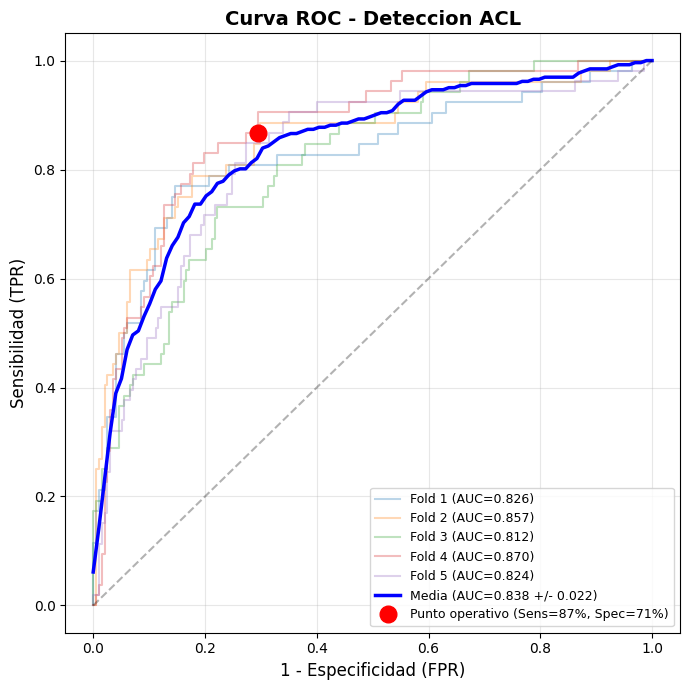

In [18]:
# Curva ROC con punto operativo
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1, figsize=(7, 7))
for i, r in enumerate(results, 1):
    fpr, tpr, _ = roc_curve(r['labels'], r['probs'])
    ax.plot(fpr, tpr, alpha=0.3, label=f'Fold {i} (AUC={r["auc"]:.3f})')

# Media
mean_fpr = np.linspace(0, 1, 100)
mean_tpr = np.zeros_like(mean_fpr)
for r in results:
    fpr, tpr, _ = roc_curve(r['labels'], r['probs'])
    mean_tpr += np.interp(mean_fpr, fpr, tpr)
mean_tpr /= len(results)
ax.plot(mean_fpr, mean_tpr, 'b-', lw=2.5,
        label=f'Media (AUC={np.mean(auc_s):.3f} +/- {np.std(auc_s):.3f})')

# Punto operativo del mejor fold
bi = np.argmax(f1_s)
r = results[bi]
pred = (r['probs'] >= r['threshold']).astype(int)
op_sens = recall_score(r['labels'], pred, zero_division=0)
op_fpr = 1 - recall_score(1-r['labels'], 1-pred, zero_division=0)
ax.plot(op_fpr, op_sens, 'ro', markersize=12, zorder=5,
        label=f'Punto operativo (Sens={op_sens*100:.0f}%, Spec={100-op_fpr*100:.0f}%)')

ax.plot([0,1], [0,1], 'k--', alpha=0.3)
ax.set_xlabel('1 - Especificidad (FPR)', fontsize=12)
ax.set_ylabel('Sensibilidad (TPR)', fontsize=12)
ax.set_title('Curva ROC - Deteccion ACL', fontsize=14, fontweight='bold')
ax.legend(loc='lower right', fontsize=9)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'roc_curve.png'), dpi=200, bbox_inches='tight')
plt.show()

In [19]:
print("="*70)
print("EVALUACION PHASE 1: DETECCION DE ANOMALIAS")
print("="*70)

skf_eval = StratifiedKFold(n_splits=CONFIG['n_folds'], shuffle=True, random_state=CONFIG['random_seed'])
p1_results = []

for fold_idx, (_, test_idx) in enumerate(skf_eval.split(all_labels, all_labels['acl'])):
    fold_num, model, thr, test_df_fold = best_models[fold_idx]
    model = model.to(device)
    model.eval()

    dl = DataLoader(make_ds(test_df_fold), batch_size=CONFIG['batch_size'], shuffle=False, num_workers=2)

    p1_probs, p1_labels = [], []
    with torch.no_grad():
        for (sag, cor, axi), labels in dl:
            sag, cor, axi = sag.to(device), cor.to(device), axi.to(device)
            out = model(sag, cor, axi, phase=1)
            p1_probs.extend(torch.sigmoid(out).reshape(-1).cpu().numpy().tolist())
            p1_labels.extend(labels[:, 0].numpy().tolist())

    p1_probs, p1_labels = np.array(p1_probs), np.array(p1_labels)
    p1_pred = (p1_probs >= 0.5).astype(int)
    sens = recall_score(p1_labels, p1_pred, zero_division=0)
    spec = recall_score(1-p1_labels, 1-p1_pred, zero_division=0)
    roc_auc = auc(*roc_curve(p1_labels, p1_probs)[:2])

    p1_results.append({'sens': sens, 'spec': spec, 'auc': roc_auc})
    print(f"  Fold {fold_num}: Sens={sens*100:.1f}% Spec={spec*100:.1f}% AUC={roc_auc:.3f}")

    model = model.cpu()
    del dl
    torch.cuda.empty_cache()

print(f"\nMedia:")
print(f"  Sens: {np.mean([r['sens'] for r in p1_results])*100:.1f}% +/- {np.std([r['sens'] for r in p1_results])*100:.1f}%")
print(f"  Spec: {np.mean([r['spec'] for r in p1_results])*100:.1f}% +/- {np.std([r['spec'] for r in p1_results])*100:.1f}%")
print(f"  AUC:  {np.mean([r['auc'] for r in p1_results]):.3f} +/- {np.std([r['auc'] for r in p1_results]):.3f}")
print("="*70)

EVALUACION PHASE 1: DETECCION DE ANOMALIAS
  Fold 1: Sens=88.2% Spec=74.5% AUC=0.895
  Fold 2: Sens=83.7% Spec=70.8% AUC=0.900
  Fold 3: Sens=76.7% Spec=87.5% AUC=0.889
  Fold 4: Sens=82.4% Spec=82.6% AUC=0.915
  Fold 5: Sens=74.6% Spec=84.4% AUC=0.842

Media:
  Sens: 81.1% +/- 4.9%
  Spec: 80.0% +/- 6.3%
  AUC:  0.888 +/- 0.025


In [20]:
# Guardar resultados
with open(os.path.join(SAVE_DIR, 'results.json'), 'w') as f:
    json.dump({
        'config': CONFIG,
        'results': {
            'sensitivity': {'mean': float(np.mean(sens_s)), 'std': float(np.std(sens_s))},
            'specificity': {'mean': float(np.mean(spec_s)), 'std': float(np.std(spec_s))},
            'f1': {'mean': float(np.mean(f1_s)), 'std': float(np.std(f1_s))},
            'auc': {'mean': float(np.mean(auc_s)), 'std': float(np.std(auc_s))},
        },
        'per_fold': [{k: v for k, v in r.items() if k not in ('probs', 'labels')} for r in results]
    }, f, indent=2)
print("Resultados guardados.")

Resultados guardados.


## 7. Interpretabilidad: Attention Weights + GradCAM++

Con attention pooling la interpretabilidad tiene dos capas:
- **Pesos de atencion:** que slices considero el modelo mas informativos (grafico de barras)
- **GradCAM++:** donde mira el modelo dentro de esos slices (mapa de calor)

In [21]:
class GradCAMPP:
    def __init__(self,model,layer):
        self.model=model; self.grads=None; self.acts=None
        self._hf=layer.register_forward_hook(lambda m,i,o: setattr(self,'acts',o.detach()))
        self._hb=layer.register_full_backward_hook(lambda m,gi,go: setattr(self,'grads',go[0].detach()))
    def remove(self): self._hf.remove(); self._hb.remove()
    def __call__(self,inp,cls=0):
        self.model.eval(); out=self.model(inp.unsqueeze(0).to(device))
        self.model.zero_grad(); out[:,cls].backward()
        g,a=self.grads[0],self.acts[0]
        alpha=g.pow(2)/(2*g.pow(2)+(a*g.pow(3)).sum((1,2),keepdim=True)+1e-8)
        cam=F.relu((((alpha*F.relu(g)).sum((1,2),keepdim=True))*a).sum(0))
        return ((cam-cam.min())/(cam.max()+1e-8)).cpu().numpy()

def attn_quality(cam):
    if cam.max()-cam.min()<0.1: return 0.0,'uniforme'
    thr=np.percentile(cam,75); h,w=cam.shape
    cm=np.zeros_like(cam); ch,cw=h//4,w//4; cm[ch:-ch,cw:-cw]=1
    high=cam>thr; ca=(high*cm).sum()/(cm.sum()+1e-8); ea=(high*(1-cm)).sum()/((1-cm).sum()+1e-8)
    q=float(ca/(ca+ea+1e-8))
    if q>0.6: return q,'centro'
    elif q<0.3: return q,'bordes'
    return q,'distribuido'

print("GradCAM++ definido.")

GradCAM++ definido.


Mejor fold: 4 (F1=0.586, AUC=0.870), Thr=0.330
Casos seleccionados:
  TP: caso 0018
  FP: caso 0019
  FN: caso 0311
  TN: caso 0016


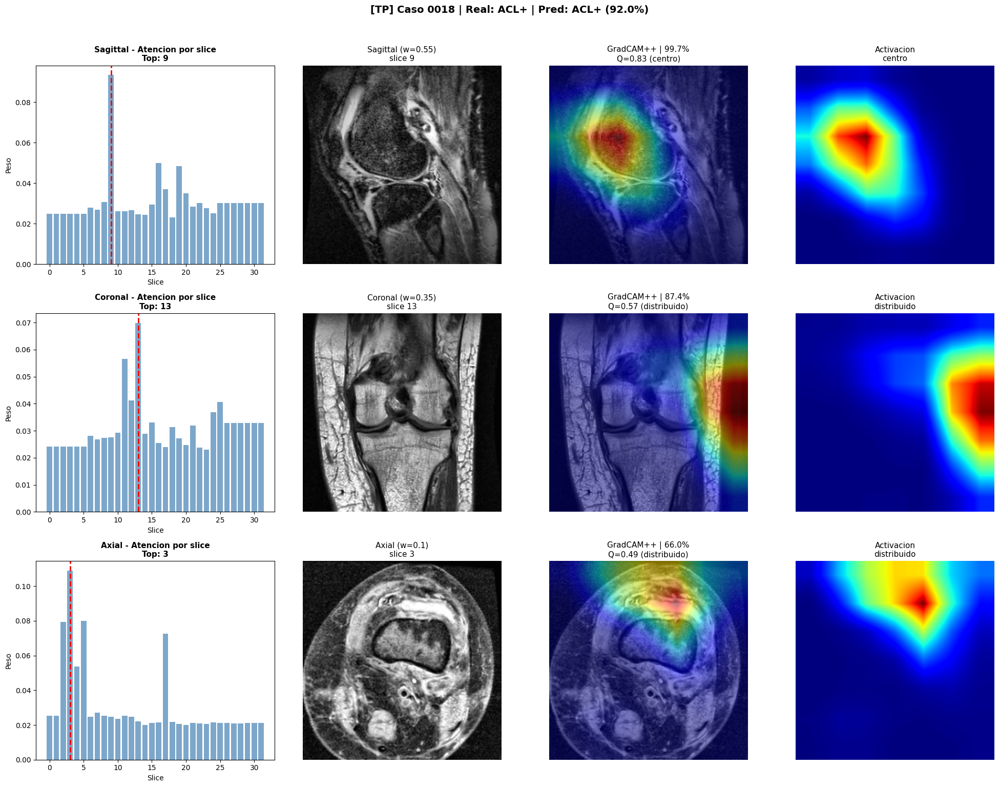

  [TP] 0018: ACL+->ACL+ (92.0%) Top slices: {'sagittal': [9], 'coronal': [13], 'axial': [3]}



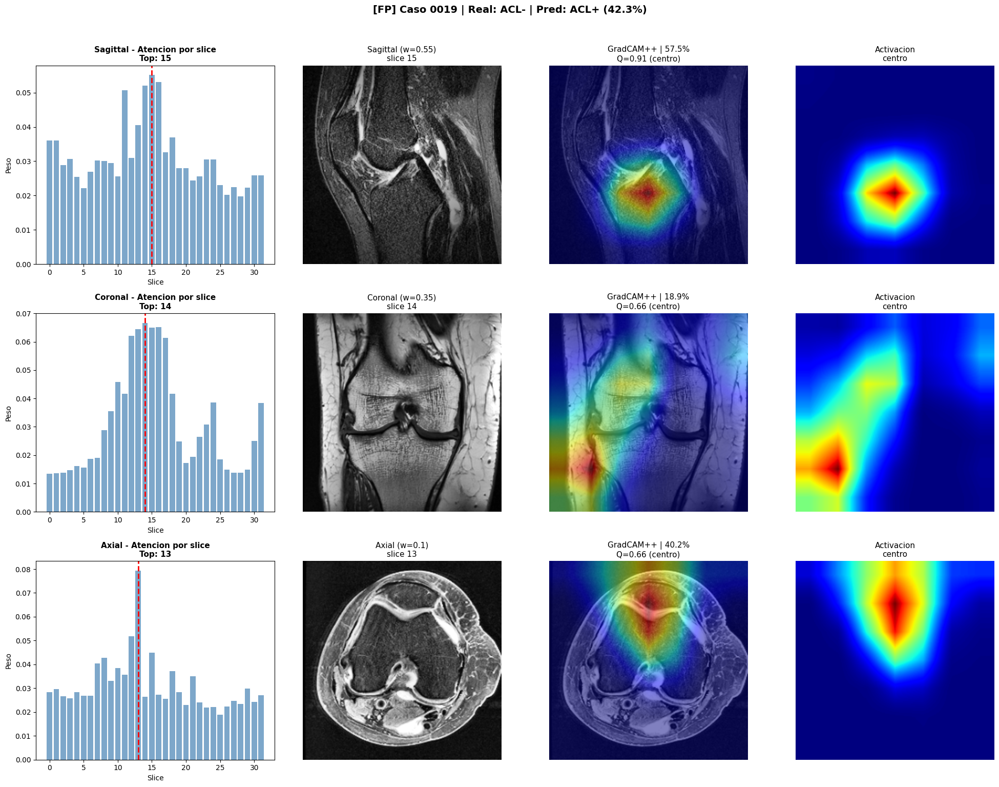

  [FP] 0019: ACL-->ACL+ (42.3%) Top slices: {'sagittal': [15], 'coronal': [14], 'axial': [13]}



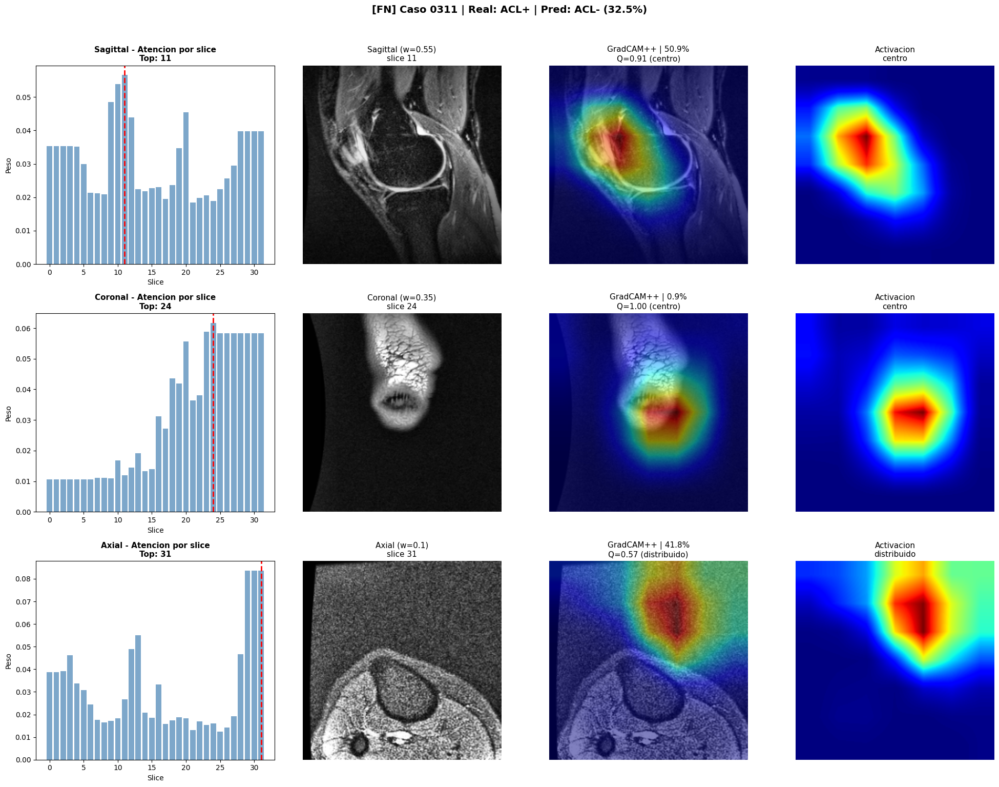

  [FN] 0311: ACL+->ACL- (32.5%) Top slices: {'sagittal': [11], 'coronal': [24], 'axial': [31]}



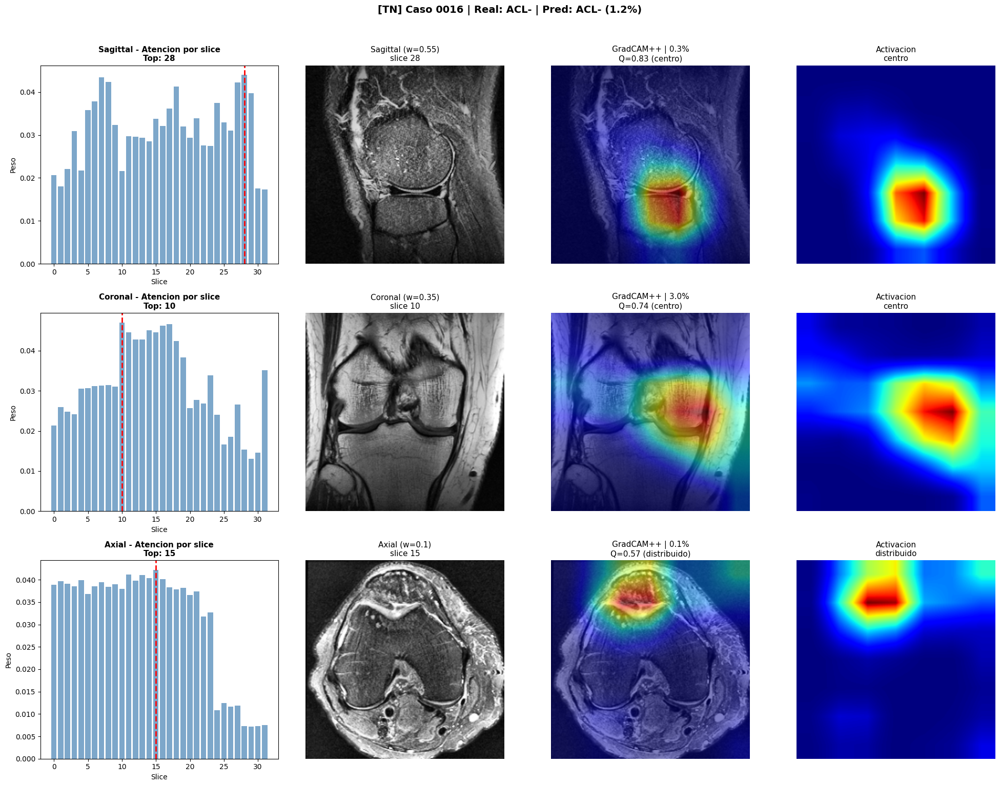

  [TN] 0016: ACL-->ACL- (1.2%) Top slices: {'sagittal': [28], 'coronal': [10], 'axial': [15]}



In [22]:
best_idx=np.argmax(f1_s)
best_fold,best_model,best_thr,test_df=best_models[best_idx]
best_model=best_model.to(device); best_model.eval()
test_ds=make_ds(test_df)
print(f"Mejor fold: {best_fold} (F1={f1_s[best_idx]:.3f}, AUC={auc_s[best_idx]:.3f}), Thr={best_thr:.3f}")

# Clasificar todos los casos del test para encontrar TP/FP/FN/TN
case_types = {'TP': None, 'FP': None, 'FN': None, 'TN': None}

for idx_row, cr in test_df.iterrows():
    cidx = test_df[test_df['case'] == cr['case']].index[0]
    (sag, cor, axi), labels = test_ds[cidx]
    with torch.no_grad():
        out = best_model(sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device),
                         axi.unsqueeze(0).to(device), phase=2)
    prob = out[0, 0].item()
    pred_acl = 1 if prob >= best_thr else 0
    true_acl = int(cr['acl'])

    if true_acl == 1 and pred_acl == 1 and case_types['TP'] is None:
        case_types['TP'] = cr['case']
    elif true_acl == 0 and pred_acl == 1 and case_types['FP'] is None:
        case_types['FP'] = cr['case']
    elif true_acl == 1 and pred_acl == 0 and case_types['FN'] is None:
        case_types['FN'] = cr['case']
    elif true_acl == 0 and pred_acl == 0 and case_types['TN'] is None:
        case_types['TN'] = cr['case']

    if all(v is not None for v in case_types.values()):
        break

print("Casos seleccionados:")
for ct, cid in case_types.items():
    print(f"  {ct}: caso {cid}")
os.makedirs(os.path.join(SAVE_DIR, 'interpretability'), exist_ok=True)
# Visualizar cada caso
for case_type, cid in case_types.items():
    if cid is None:
        continue
    cidx = test_df[test_df['case'] == cid].index[0]
    cr = test_df.iloc[cidx]
    ta = cr['acl']
    (sag, cor, axi), _ = test_ds[cidx]

    attn = best_model.get_attention_weights(
        sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device), axi.unsqueeze(0).to(device))
    tops = best_model.get_top_slices(
        sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device), axi.unsqueeze(0).to(device), top_k=1)

    with torch.no_grad():
        ind = best_model(sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device),
                         axi.unsqueeze(0).to(device), phase=2, return_individual=True)
    fp = ind['fused'][0, 0].item()
    pps = [torch.sigmoid(ind['sagittal'][0,0]).item(),
           torch.sigmoid(ind['coronal'][0,0]).item(),
           torch.sigmoid(ind['axial'][0,0]).item()]

    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    for r, (pn, pm, pv, pw, pp) in enumerate(zip(
            ['Sagittal','Coronal','Axial'],
            [best_model.p2_sag, best_model.p2_cor, best_model.p2_axi],
            [sag, cor, axi], CONFIG['acl_weights'], pps)):
        ti = tops[pn.lower()][0]
        aw = attn[pn.lower()]

        axes[r,0].bar(range(len(aw)), aw, color='steelblue', alpha=0.7)
        axes[r,0].axvline(ti, color='red', lw=2, ls='--')
        axes[r,0].set_title(f"{pn} - Atencion por slice\nTop: {ti}", fontsize=11, fontweight='bold')
        axes[r,0].set_xlabel('Slice'); axes[r,0].set_ylabel('Peso')

        gc = GradCAMPP(pm, get_target_layer(pm, CONFIG.get('backbone','resnet18')))
        si = pv[0, ti].numpy()
        cam = gc(pv[0, ti].unsqueeze(0), cls=0); gc.remove()
        cam_r = cv2.resize(cam, (si.shape[1], si.shape[0]))
        cam_r = cam_r ** 2  # Concentra las activaciones altas
        q, ft = attn_quality(cam)

        axes[r,1].imshow(si, cmap='gray')
        axes[r,1].set_title(f"{pn} (w={pw})\nslice {ti}", fontsize=11); axes[r,1].axis('off')
        axes[r,2].imshow(si, cmap='gray'); axes[r,2].imshow(cam_r, cmap='jet', alpha=0.5)
        axes[r,2].set_title(f"GradCAM++ | {pp*100:.1f}%\nQ={q:.2f} ({ft})", fontsize=11); axes[r,2].axis('off')
        axes[r,3].imshow(cam_r, cmap='jet')
        axes[r,3].set_title(f"Activacion\n{ft}", fontsize=11); axes[r,3].axis('off')

    pred = 'ACL+' if fp >= best_thr else 'ACL-'
    tl = 'ACL+' if ta == 1 else 'ACL-'
    fig.suptitle(f"[{case_type}] Caso {cid} | Real: {tl} | Pred: {pred} ({fp*100:.1f}%)",
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(os.path.join(SAVE_DIR, 'interpretability', f'gradcam_{case_type}_{cid}.png'),
                dpi=200, bbox_inches='tight')
    plt.show()
    print(f"  [{case_type}] {cid}: {tl}->{pred} ({fp*100:.1f}%) Top slices: {tops}\n")

## 8. Ablacion por plano (post-entrenamiento)

ABLACION POR PLANO


  Evaluando: 100%|██████████| 125/125 [00:23<00:00,  5.23it/s]


  Test (thr=0.330): Sens=86.8% Spec=77.7% F1=0.643 AUC=0.893 | TP=46 FN=7 FP=44 TN=153


  Evaluando: 100%|██████████| 125/125 [00:24<00:00,  5.14it/s]


  Test (thr=0.330): Sens=58.5% Spec=58.9% F1=0.376 AUC=0.555 | TP=31 FN=22 FP=81 TN=116


  Evaluando: 100%|██████████| 125/125 [00:23<00:00,  5.38it/s]


  Test (thr=0.330): Sens=62.3% Spec=83.2% F1=0.555 AUC=0.790 | TP=33 FN=20 FP=33 TN=164


  Evaluando: 100%|██████████| 125/125 [00:23<00:00,  5.36it/s]


  Test (thr=0.330): Sens=86.8% Spec=67.5% F1=0.564 AUC=0.863 | TP=46 FN=7 FP=64 TN=133


  Evaluando: 100%|██████████| 125/125 [00:23<00:00,  5.26it/s]


  Test (thr=0.330): Sens=86.8% Spec=70.6% F1=0.586 AUC=0.870 | TP=46 FN=7 FP=58 TN=139

Config                   Sens     Spec       F1      AUC
  Solo sagittal         86.8%    77.7%   0.643   0.893
  Solo coronal          58.5%    58.9%   0.376   0.555
  Solo axial            62.3%    83.2%   0.555   0.790
  Sag+Cor               86.8%    67.5%   0.564   0.863
  Completo              86.8%    70.6%   0.586   0.870


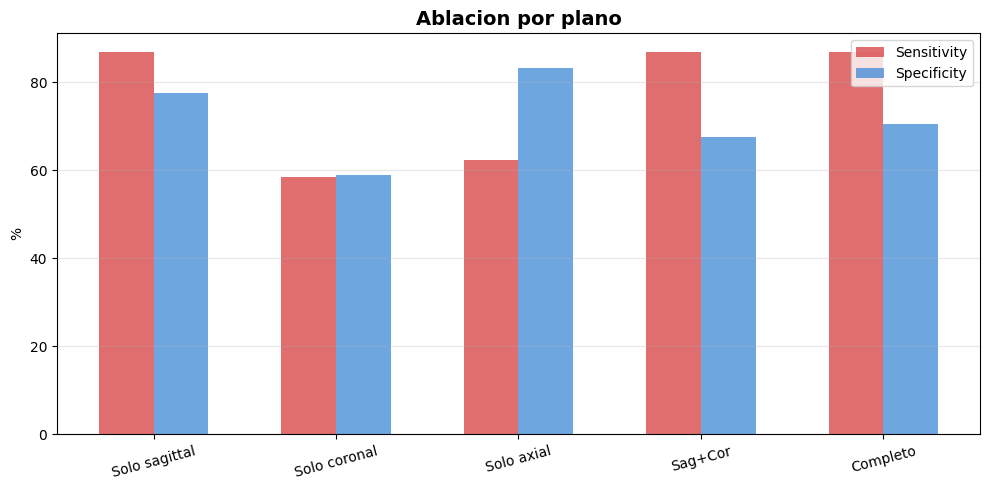

In [23]:
print("="*70)
print("ABLACION POR PLANO")
print("="*70)

test_loader=DataLoader(test_ds,batch_size=CONFIG['batch_size'],shuffle=False,num_workers=2)
configs_abl=[("Solo sagittal",[1.0,0.0,0.0]),("Solo coronal",[0.0,1.0,0.0]),("Solo axial",[0.0,0.0,1.0]),("Sag+Cor",[0.6,0.4,0.0]),("Completo",CONFIG['acl_weights'])]
abl_res=[]
for name,w in configs_abl:
    best_model.acl_w=torch.tensor(w,dtype=torch.float32)
    m=evaluate(best_model,test_loader,threshold=best_thr); m['name']=name; m['weights']=w; abl_res.append(m)
best_model.acl_w=torch.tensor(CONFIG['acl_weights'],dtype=torch.float32)

print(f"\n{'Config':20s} {'Sens':>8s} {'Spec':>8s} {'F1':>8s} {'AUC':>8s}")
for r in abl_res: print(f"  {r['name']:18s} {r['sens']*100:7.1f}% {r['spec']*100:7.1f}% {r['f1']:7.3f} {r['auc']:7.3f}")

fig,ax=plt.subplots(figsize=(10,5))
x=range(len(abl_res))
ax.bar([i-0.15 for i in x],[r['sens']*100 for r in abl_res],0.3,label='Sensitivity',color='#D94A4A',alpha=0.8)
ax.bar([i+0.15 for i in x],[r['spec']*100 for r in abl_res],0.3,label='Specificity',color='#4A90D9',alpha=0.8)
ax.set_xticks(x); ax.set_xticklabels([r['name'] for r in abl_res],rotation=15)
ax.set_ylabel('%'); ax.set_title('Ablacion por plano',fontsize=14,fontweight='bold'); ax.legend(); ax.grid(alpha=0.3,axis='y')
plt.tight_layout(); plt.savefig(os.path.join(SAVE_DIR,'figures','ablation_plano.png'),dpi=200,bbox_inches='tight'); plt.show()

In [24]:
# Optimizacion de pesos de fusion (post-entrenamiento)
print("="*70)
print("OPTIMIZACION DE PESOS DE FUSION")
print("="*70)

dl_test = DataLoader(test_ds, batch_size=CONFIG['batch_size'], shuffle=False, num_workers=2)

# Recoger probabilidades por plano
best_model.to(device); best_model.eval()
sag_probs, cor_probs, axi_probs, labels_all = [], [], [], []

with torch.no_grad():
    for (sag, cor, axi), labels in dl_test:
        sag, cor, axi = sag.to(device), cor.to(device), axi.to(device)
        ind = best_model(sag, cor, axi, phase=2, return_individual=True)
        sag_probs.extend(torch.sigmoid(ind['sagittal'][:, 0]).cpu().numpy().tolist())
        cor_probs.extend(torch.sigmoid(ind['coronal'][:, 0]).cpu().numpy().tolist())
        axi_probs.extend(torch.sigmoid(ind['axial'][:, 0]).cpu().numpy().tolist())
        labels_all.extend(labels[:, 1].numpy().tolist())

sag_p = np.array(sag_probs)
cor_p = np.array(cor_probs)
axi_p = np.array(axi_probs)
y_true = np.array(labels_all)

# Buscar mejores pesos
print(f"\n{'Pesos (S/C/A)':20s} {'Sens':>8s} {'Spec':>8s} {'F1':>8s} {'AUC':>8s} {'Thr':>8s}")
print("-" * 60)

best_config = None
best_sens_at_target = 0

for ws in [0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85, 0.9, 1.0]:
    for wc in [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4]:
        wa = round(1.0 - ws - wc, 2)
        if wa < 0:
            continue
        fused = ws * sag_p + wc * cor_p + wa * axi_p
        roc_auc = auc(*roc_curve(y_true, fused)[:2])

        # Threshold clinico
        best_thr_opt = 0.5
        best_spec_opt = 0
        for thr in np.arange(0.05, 0.95, 0.01):
            pred = (fused >= thr).astype(int)
            sens = recall_score(y_true, pred, zero_division=0)
            spec = recall_score(1-y_true, 1-pred, zero_division=0)
            if sens >= 0.80 and spec > best_spec_opt:
                best_spec_opt = spec
                best_thr_opt = thr

        pred_opt = (fused >= best_thr_opt).astype(int)
        s = recall_score(y_true, pred_opt, zero_division=0)
        sp = recall_score(1-y_true, 1-pred_opt, zero_division=0)
        f = f1_score(y_true, pred_opt, zero_division=0)

        if s >= 0.80 and (best_config is None or roc_auc > best_config[4]):
            best_config = (ws, wc, wa, best_thr_opt, roc_auc, s, sp, f)

# Mostrar top configs
for ws in [0.55, 0.7, 0.85, 1.0]:
    for wc_val in [0.0, 0.15, 0.3]:
        wa_val = round(1.0 - ws - wc_val, 2)
        if wa_val < 0:
            continue
        fused = ws * sag_p + wc_val * cor_p + wa_val * axi_p
        roc_auc = auc(*roc_curve(y_true, fused)[:2])
        best_t = 0.5
        best_sp = 0
        for thr in np.arange(0.05, 0.95, 0.01):
            pred = (fused >= thr).astype(int)
            se = recall_score(y_true, pred, zero_division=0)
            sp = recall_score(1-y_true, 1-pred, zero_division=0)
            if se >= 0.80 and sp > best_sp:
                best_sp = sp; best_t = thr
        pred = (fused >= best_t).astype(int)
        s = recall_score(y_true, pred, zero_division=0)
        sp = recall_score(1-y_true, 1-pred, zero_division=0)
        f = f1_score(y_true, pred, zero_division=0)
        tag = " <-- actual" if ws == CONFIG['acl_weights'][0] and wc_val == CONFIG['acl_weights'][1] else ""
        print(f"  ({ws:.2f}/{wc_val:.2f}/{wa_val:.2f}) {s*100:7.1f}% {sp*100:7.1f}% {f:7.3f} {roc_auc:7.3f} {best_t:7.3f}{tag}")

if best_config:
    ws, wc, wa, thr, rauc, s, sp, f = best_config
    print(f"\nMejor config (Sens>=80%, max AUC):")
    print(f"  Pesos: Sag={ws}, Cor={wc}, Axi={wa}")
    print(f"  Sens={s*100:.1f}% Spec={sp*100:.1f}% F1={f:.3f} AUC={rauc:.3f} Thr={thr:.3f}")
    print(f"\nConfig actual: Sag={CONFIG['acl_weights'][0]}, Cor={CONFIG['acl_weights'][1]}, Axi={CONFIG['acl_weights'][2]}")
print("="*70)

OPTIMIZACION DE PESOS DE FUSION

Pesos (S/C/A)            Sens     Spec       F1      AUC      Thr
------------------------------------------------------------
  (0.55/0.00/0.45)    81.1%    82.2%   0.656   0.878   0.400
  (0.55/0.15/0.30)    83.0%    80.7%   0.652   0.876   0.390
  (0.55/0.30/0.15)    81.1%    80.7%   0.642   0.873   0.410
  (0.70/0.00/0.30)    83.0%    82.7%   0.672   0.884   0.440
  (0.70/0.15/0.15)    84.9%    80.7%   0.662   0.885   0.410
  (0.70/0.30/0.00)    81.1%    81.7%   0.652   0.878   0.440
  (0.85/0.00/0.15)    84.9%    80.2%   0.657   0.886   0.420
  (0.85/0.15/0.00)    81.1%    80.7%   0.642   0.893   0.450
  (1.00/0.00/0.00)    83.0%    79.7%   0.642   0.893   0.440

Mejor config (Sens>=80%, max AUC):
  Pesos: Sag=1.0, Cor=0.0, Axi=0.0
  Sens=83.0% Spec=79.7% F1=0.642 AUC=0.893 Thr=0.440

Config actual: Sag=0.55, Cor=0.35, Axi=0.1


## 9. Reportes clinicos

In [25]:
os.makedirs(os.path.join(SAVE_DIR, 'reports'), exist_ok=True)
def generar_reporte(model, case_data, case_id, threshold):
    (sag, cor, axi), labels = case_data
    model.eval()

    sag_d = sag.unsqueeze(0).to(device)
    cor_d = cor.unsqueeze(0).to(device)
    axi_d = axi.unsqueeze(0).to(device)

    # Phase 1: Triaje
    with torch.no_grad():
        p1_out = model(sag_d, cor_d, axi_d, phase=1)
        p1_prob = torch.sigmoid(p1_out).reshape(-1).cpu().numpy()[0]
    anomalia = "SI" if p1_prob >= 0.30 else "NO"

    # Phase 2: ACL
    with torch.no_grad():
        ind = model(sag_d, cor_d, axi_d, phase=2, return_individual=True)

    probs = [torch.sigmoid(ind['sagittal'][0,0]).item(),
             torch.sigmoid(ind['coronal'][0,0]).item(),
             torch.sigmoid(ind['axial'][0,0]).item()]
    fused = ind['fused'][0,0].item()

    attn = model.get_attention_weights(sag_d, cor_d, axi_d)
    ws = {pn: int(np.argmax(aw)) for pn, aw in attn.items()}

    planes_q = []
    for pm, pv, wk in zip([model.p2_sag, model.p2_cor, model.p2_axi],
                           [sag, cor, axi], ['sagittal', 'coronal', 'axial']):
        gc = GradCAMPP(pm, pm.layer4[-1])
        cam = gc(pv[0, ws[wk]].unsqueeze(0), cls=0)
        gc.remove()
        q, ft = attn_quality(cam)
        planes_q.append((q, ft))

    if fused >= 0.7: nivel = "ALTO"
    elif fused >= 0.4: nivel = "MODERADO"
    elif fused >= threshold: nivel = "BAJO"
    else: nivel = "MUY BAJO"

    agreement = 1.0 - np.std(probs[:2])
    pred = 'ACL+' if fused >= threshold else 'ACL-'
    real = 'ACL+' if labels[1].item() == 1 else 'ACL-'
    real_abn = 'SI' if labels[0].item() == 1 else 'NO'

    report = []
    report.append("=" * 60)
    report.append("REPORTE DE ASISTENCIA AL DIAGNOSTICO - LESION ACL")
    report.append("=" * 60)
    report.append(f"")
    report.append(f"Caso: {case_id}")
    report.append(f"")
    report.append(f"FASE 1: TRIAJE (deteccion de anomalia)")
    report.append(f"-" * 40)
    report.append(f"Probabilidad de anomalia: {p1_prob*100:.1f}%")
    report.append(f"Rodilla anormal: {anomalia} (real: {real_abn})")
    if anomalia == "NO":
        report.append(f"La rodilla no presenta signos de anomalia.")
        report.append(f"El analisis ACL se realiza igualmente por precaucion.")
    else:
        report.append(f"Se detectan signos de anomalia. Procediendo al")
        report.append(f"analisis especifico de lesion ACL.")
    report.append(f"")
    report.append(f"FASE 2: CLASIFICACION ACL")
    report.append(f"-" * 40)
    report.append(f"Probabilidad de lesion ACL: {fused*100:.1f}%")
    report.append(f"Nivel de sospecha: {nivel}")
    report.append(f"Prediccion del sistema: {pred} (real: {real})")
    report.append(f"Threshold aplicado: {threshold:.3f}")
    report.append(f"")

    if nivel == "ALTO":
        report.append("RECOMENDACION: Se detectan signos significativos de")
        report.append("lesion ACL. Se recomienda revision detallada.")
    elif nivel == "MODERADO":
        report.append("RECOMENDACION: Signos sugestivos de lesion.")
        report.append("Evaluar en contexto clinico del paciente.")
    elif nivel == "BAJO":
        report.append("RECOMENDACION: Signos leves. Valorar seguimiento.")
    else:
        report.append("RECOMENDACION: No se detectan signos significativos.")
        report.append("Correlacionar siempre con examen clinico.")

    report.append(f"")
    report.append(f"ANALISIS POR PLANO")
    report.append(f"-" * 40)
    pnames = ['Sagittal', 'Coronal', 'Axial']
    pweights = CONFIG['acl_weights']
    for i, (pn, pp, pw, (q, ft)) in enumerate(zip(pnames, probs, pweights, planes_q)):
        pn_low = pn.lower()
        aw = attn[pn_low]
        report.append(f"  {pn} (peso={pw}):")
        report.append(f"    Probabilidad: {pp*100:.1f}%")
        report.append(f"    Slice mas relevante: {ws[pn_low]} (atencion={aw[ws[pn_low]]:.3f})")
        report.append(f"    Calidad GradCAM: {q:.2f} ({ft})")
        if ft == 'bordes':
            report.append(f"    ADVERTENCIA: enfoque en bordes, posibles artefactos.")

    report.append(f"")
    report.append(f"CONCORDANCIA")
    report.append(f"-" * 40)
    report.append(f"  Agreement sagittal/coronal: {agreement:.2f}")
    if agreement > 0.9: report.append(f"  Planos coinciden.")
    elif agreement > 0.7: report.append(f"  Concordancia moderada.")
    else: report.append(f"  Baja concordancia. Revision manual recomendada.")

    report.append(f"")
    report.append(f"  - Sistema de ASISTENCIA, no sustituye al radiologo")
    report.append(f"  - El modelo sugiere, el profesional decide")
    report.append(f"=" * 60)

    return {
        'case_id': case_id, 'probability': fused, 'prediction': pred,
        'true_label': real, 'level': nivel, 'agreement': agreement,
        'anomaly_prob': p1_prob, 'anomaly_pred': anomalia,
        'plane_probs': probs, 'plane_quality': planes_q,
        'winning_slices': ws, 'report_text': '\n'.join(report)
    }

# Seleccionar casos representativos: 2 TP, 2 TN, 1 FP, 1 FN
print("="*60)
print("REPORTES CLINICOS")
print("="*60)

report_cases = []
tp_count = fp_count = fn_count = tn_count = 0

for _, cr in test_df.iterrows():
    cidx = test_df[test_df['case'] == cr['case']].index[0]
    (sag, cor, axi), labels = test_ds[cidx]
    with torch.no_grad():
        out = best_model(sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device),
                         axi.unsqueeze(0).to(device), phase=2)
    prob = out[0, 0].item()
    pred = 1 if prob >= best_thr else 0
    true = int(cr['acl'])

    if true == 1 and pred == 1 and tp_count < 2:
        report_cases.append(cr); tp_count += 1
    elif true == 0 and pred == 0 and tn_count < 2:
        report_cases.append(cr); tn_count += 1
    elif true == 0 and pred == 1 and fp_count < 2:
        report_cases.append(cr); fp_count += 1
    elif true == 1 and pred == 0 and fn_count < 1:
        report_cases.append(cr); fn_count += 1

    if tp_count + tn_count + fp_count + fn_count >= 6:
        break

cases_to_report = pd.DataFrame(report_cases)
print(f"Casos seleccionados: {tp_count} TP, {tn_count} TN, {fp_count} FP, {fn_count} FN\n")

all_reports = []
for _, cr in cases_to_report.iterrows():
    cidx = test_df[test_df['case'] == cr['case']].index[0]
    data = test_ds[cidx]
    rep = generar_reporte(best_model, data, cr['case'], best_thr)
    all_reports.append(rep)

    print(rep['report_text'])
    with open(os.path.join(SAVE_DIR, 'reports', f'reporte_{cr["case"]}.txt'), 'w') as f:
        f.write(rep['report_text'])

print(f"\nEstadisticas ({len(all_reports)} casos):")
correct = sum(1 for r in all_reports if r['prediction'] == r['true_label'])
print(f"  Precision: {correct}/{len(all_reports)} ({correct/len(all_reports)*100:.1f}%)")
anom_correct = sum(1 for r in all_reports if r['anomaly_pred'] == ('SI' if r['true_label'] != 'ACL-' or any(l == 1 for l in []) else 'NO'))
print(f"  Triaje anomalia correctos: ver reportes individuales")

REPORTES CLINICOS
Casos seleccionados: 2 TP, 2 TN, 2 FP, 0 FN

REPORTE DE ASISTENCIA AL DIAGNOSTICO - LESION ACL

Caso: 0016

FASE 1: TRIAJE (deteccion de anomalia)
----------------------------------------
Probabilidad de anomalia: 78.1%
Rodilla anormal: SI (real: SI)
Se detectan signos de anomalia. Procediendo al
analisis especifico de lesion ACL.

FASE 2: CLASIFICACION ACL
----------------------------------------
Probabilidad de lesion ACL: 1.2%
Nivel de sospecha: MUY BAJO
Prediccion del sistema: ACL- (real: ACL-)
Threshold aplicado: 0.330

RECOMENDACION: No se detectan signos significativos.
Correlacionar siempre con examen clinico.

ANALISIS POR PLANO
----------------------------------------
  Sagittal (peso=0.55):
    Probabilidad: 0.3%
    Slice mas relevante: 28 (atencion=0.044)
    Calidad GradCAM: 0.83 (centro)
  Coronal (peso=0.35):
    Probabilidad: 3.0%
    Slice mas relevante: 10 (atencion=0.047)
    Calidad GradCAM: 0.74 (centro)
  Axial (peso=0.1):
    Probabilidad: 0.1%

ANALISIS DE ERRORES
Falsos Negativos (lesiones no detectadas): 7
Falsos Positivos (falsas alarmas): 58

DETALLE: FALSO NEGATIVOS (4 de 7)


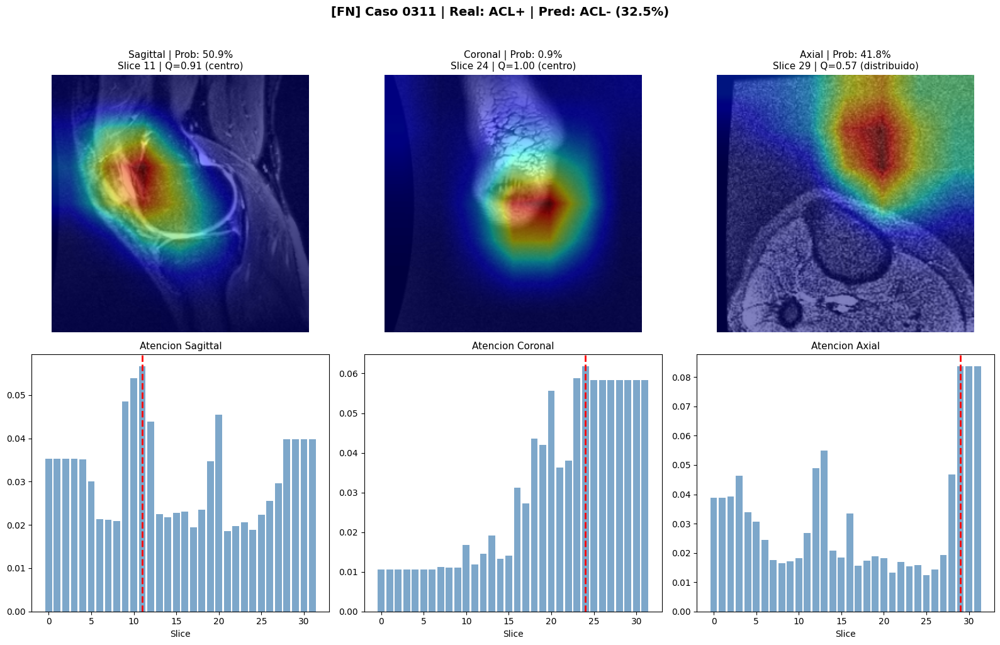

  [FN] 0311: prob=32.5% | Sag=50.9% Cor=0.9% Axi=41.8%


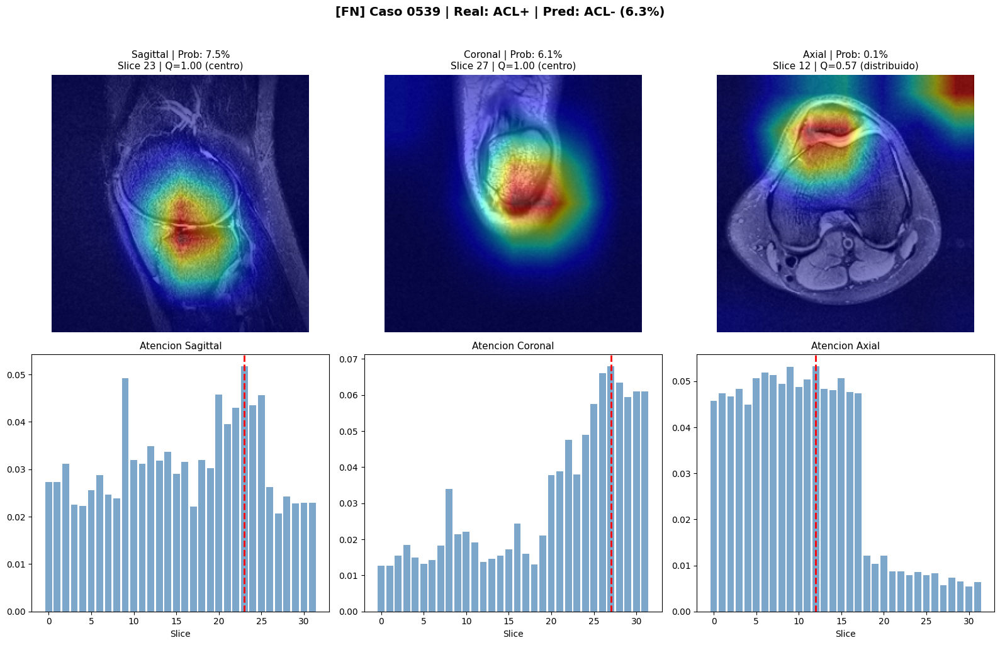

  [FN] 0539: prob=6.3% | Sag=7.5% Cor=6.1% Axi=0.1%


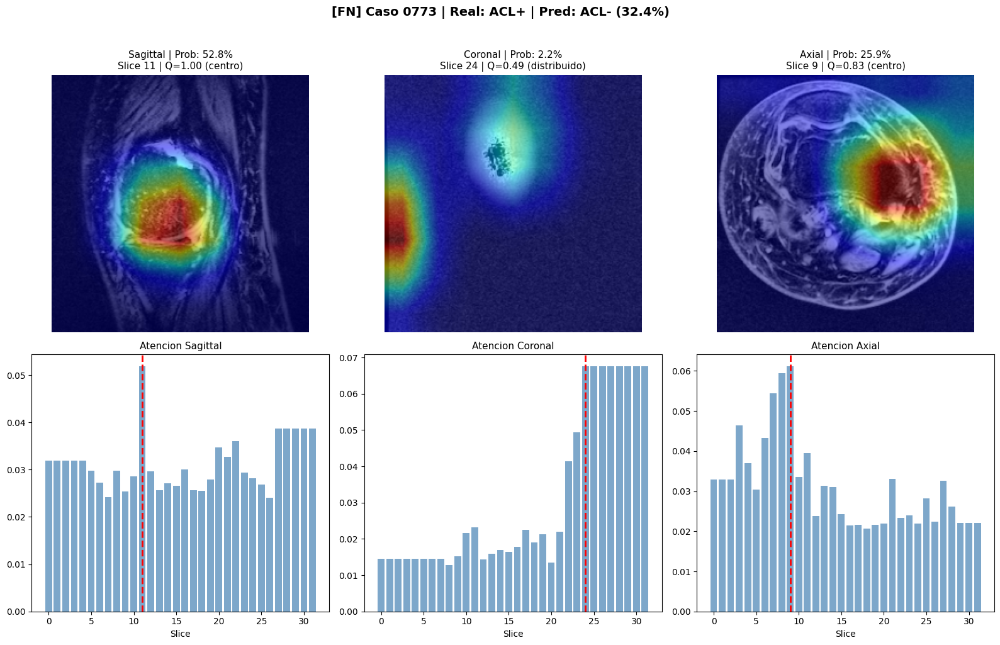

  [FN] 0773: prob=32.4% | Sag=52.8% Cor=2.2% Axi=25.9%


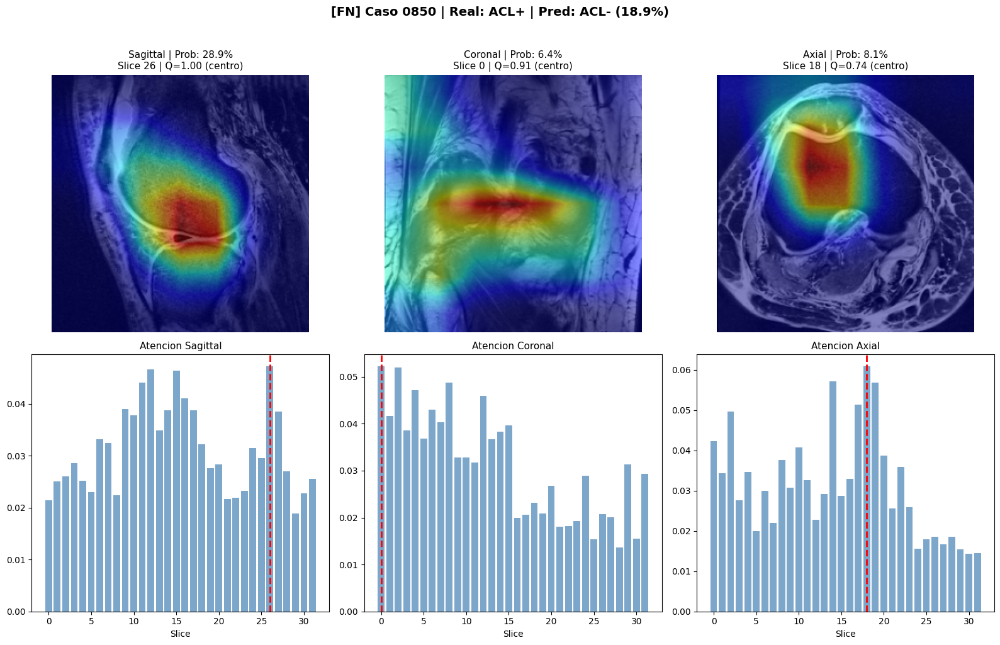

  [FN] 0850: prob=18.9% | Sag=28.9% Cor=6.4% Axi=8.1%

DETALLE: FALSO POSITIVOS (4 de 58)


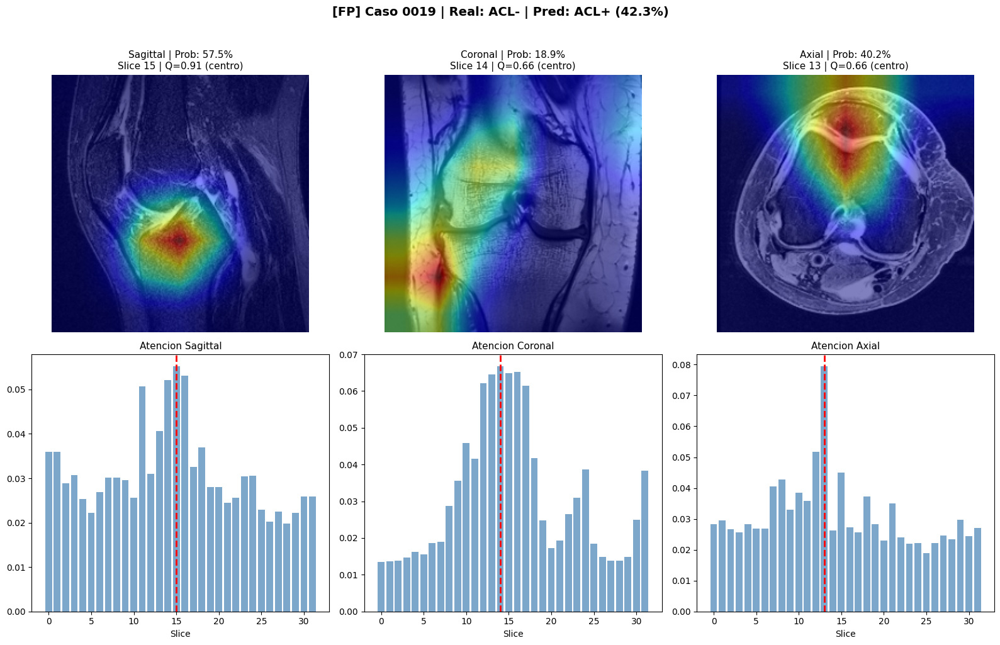

  [FP] 0019: prob=42.3% | Sag=57.5% Cor=18.9% Axi=40.2%


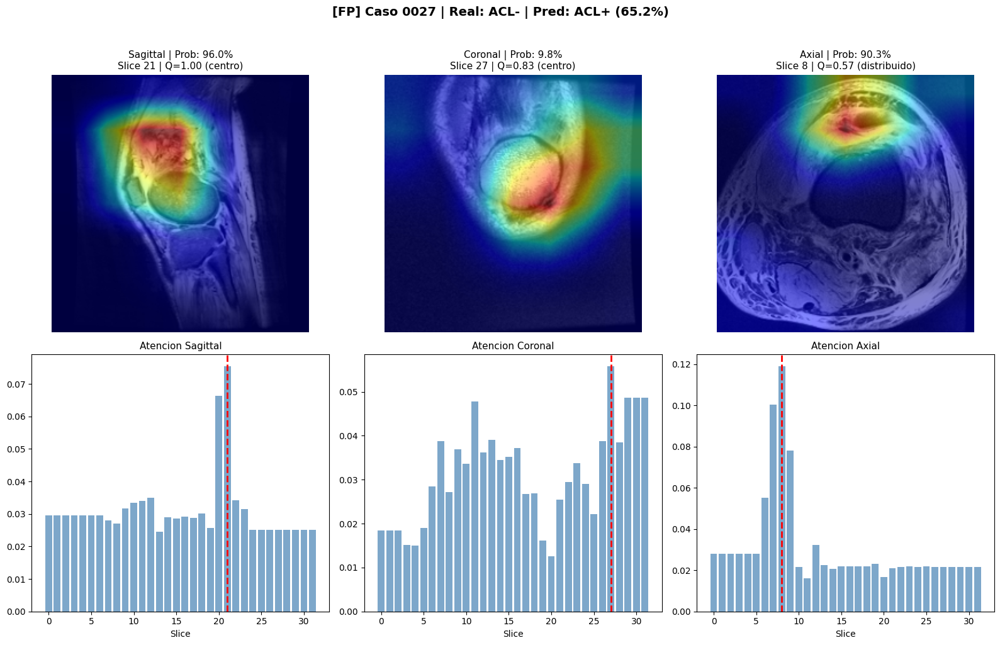

  [FP] 0027: prob=65.2% | Sag=96.0% Cor=9.8% Axi=90.3%


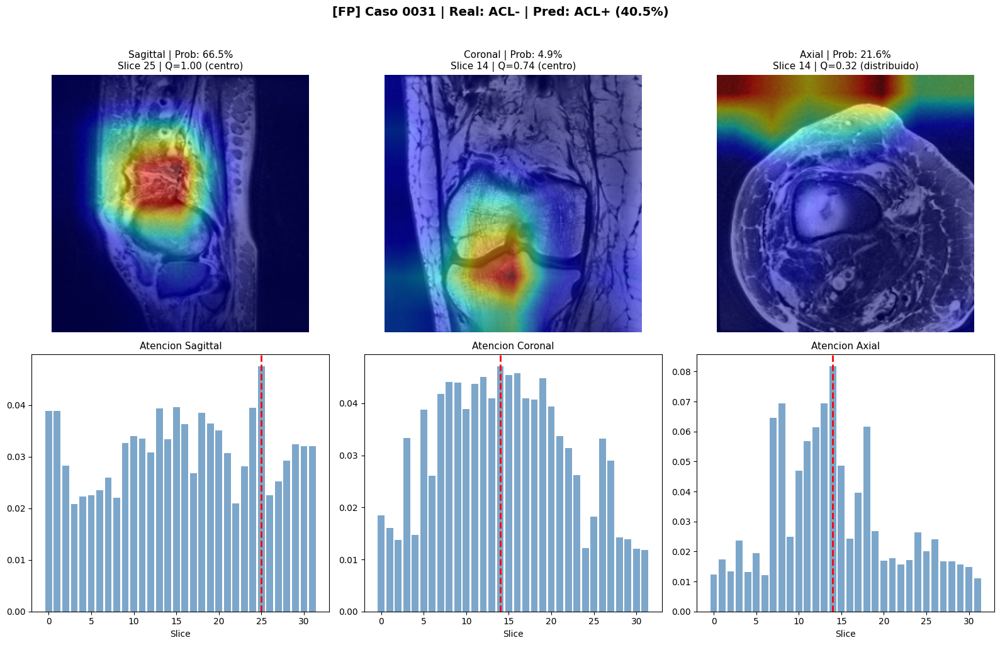

  [FP] 0031: prob=40.5% | Sag=66.5% Cor=4.9% Axi=21.6%


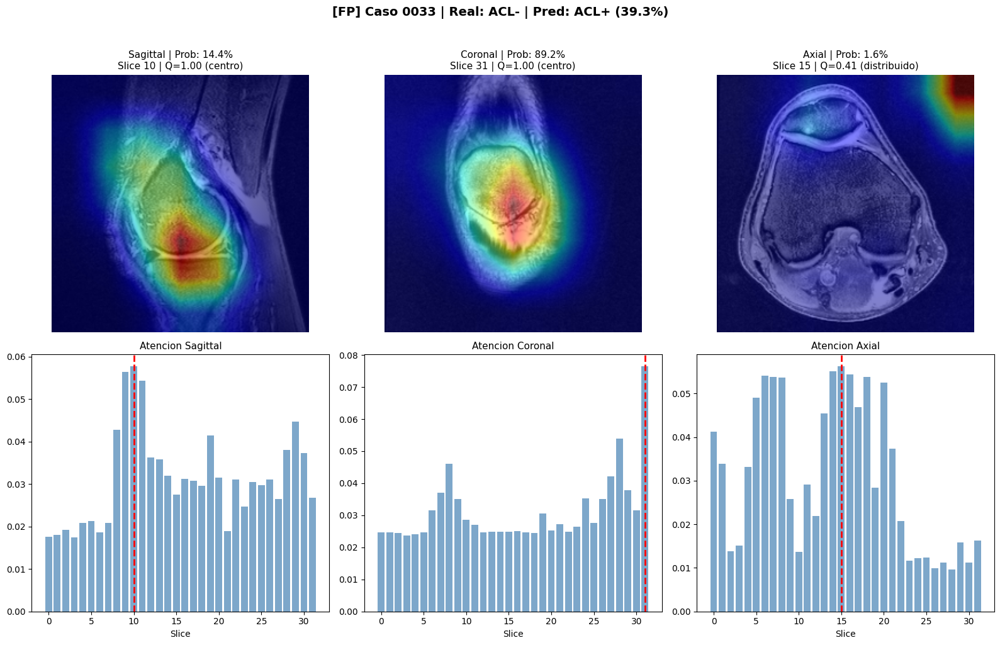

  [FP] 0033: prob=39.3% | Sag=14.4% Cor=89.2% Axi=1.6%

Patrones observados:
  FN: prob media=21.5%, max=32.5%
      1/7 con prob < 15% (modelo muy seguro de que no hay lesion)
      6/7 con prob >= 15% (cerca del threshold)
  FP: prob media=53.0%, min=33.1%
      25/58 con prob > 50% (modelo muy convencido)
      33/58 con prob <= 50% (cerca del threshold)


In [26]:
# ================================================================
# ANALISIS DE ERRORES: Falsos Negativos y Falsos Positivos
# ================================================================
print("="*70)
print("ANALISIS DE ERRORES")
print("="*70)

best_model.to(device); best_model.eval()

# Recoger TODOS los FN y FP del test set
all_fn, all_fp = [], []
for idx_row, cr in test_df.iterrows():
    cidx = test_df[test_df['case'] == cr['case']].index[0]
    (sag, cor, axi), labels = test_ds[cidx]
    with torch.no_grad():
        out = best_model(sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device),
                         axi.unsqueeze(0).to(device), phase=2)
    prob = out[0, 0].item()
    pred = 1 if prob >= best_thr else 0
    true = int(cr['acl'])
    if true == 1 and pred == 0: all_fn.append((cr['case'], prob, cidx))
    elif true == 0 and pred == 1: all_fp.append((cr['case'], prob, cidx))

print(f"Falsos Negativos (lesiones no detectadas): {len(all_fn)}")
print(f"Falsos Positivos (falsas alarmas): {len(all_fp)}")

# Visualizar hasta 4 FN y 4 FP
for error_type, cases, color in [("FALSO NEGATIVO", all_fn[:4], 'Reds'),
                                  ("FALSO POSITIVO", all_fp[:4], 'Blues')]:
    if not cases:
        print(f"\nNo hay {error_type}s en este fold.")
        continue

    print(f"\n{'='*70}")
    print(f"DETALLE: {error_type}S ({len(cases)} de {len(all_fn) if 'NEG' in error_type else len(all_fp)})")
    print(f"{'='*70}")

    for cid, prob, cidx in cases:
        (sag, cor, axi), labels = test_ds[cidx]

        # Attention weights
        attn = best_model.get_attention_weights(
            sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device), axi.unsqueeze(0).to(device))
        tops = {pn: int(np.argmax(aw)) for pn, aw in attn.items()}

        # Prediccion por plano
        with torch.no_grad():
            ind = best_model(sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device),
                             axi.unsqueeze(0).to(device), phase=2, return_individual=True)
        pps = [torch.sigmoid(ind['sagittal'][0,0]).item(),
               torch.sigmoid(ind['coronal'][0,0]).item(),
               torch.sigmoid(ind['axial'][0,0]).item()]

        fig, axes = plt.subplots(2, 3, figsize=(16, 10))
        pnames = ['Sagittal', 'Coronal', 'Axial']
        pmodels = [best_model.p2_sag, best_model.p2_cor, best_model.p2_axi]
        pvols = [sag, cor, axi]

        for c, (pn, pm, pv, pp) in enumerate(zip(pnames, pmodels, pvols, pps)):
            ti = tops[pn.lower()]
            aw = attn[pn.lower()]

            # Fila 1: imagen + GradCAM overlay
            gc = GradCAMPP(pm, pm.layer4[-1])
            si = pv[0, ti].numpy()
            cam = gc(pv[0, ti].unsqueeze(0), cls=0); gc.remove()
            cam_r = cv2.resize(cam, (si.shape[1], si.shape[0]))
            cam_r= cam_r ** 2
            q, ft = attn_quality(cam)

            axes[0, c].imshow(si, cmap='gray')
            axes[0, c].imshow(cam_r, cmap='jet', alpha=0.5)
            axes[0, c].set_title(f"{pn} | Prob: {pp*100:.1f}%\nSlice {ti} | Q={q:.2f} ({ft})", fontsize=11)
            axes[0, c].axis('off')

            # Fila 2: attention por slice
            axes[1, c].bar(range(len(aw)), aw, color='steelblue', alpha=0.7)
            axes[1, c].axvline(ti, color='red', lw=2, ls='--')
            axes[1, c].set_title(f"Atencion {pn}", fontsize=11)
            axes[1, c].set_xlabel('Slice')

        tag = "FN" if "NEG" in error_type else "FP"
        real = "ACL+" if "NEG" in error_type else "ACL-"
        pred_str = "ACL-" if "NEG" in error_type else "ACL+"
        fig.suptitle(f"[{tag}] Caso {cid} | Real: {real} | Pred: {pred_str} ({prob*100:.1f}%)",
                     fontsize=14, fontweight='bold', y=1.02)
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, 'interpretability', f'error_{tag}_{cid}.png'),
                    dpi=200, bbox_inches='tight')
        plt.show()
        print(f"  [{tag}] {cid}: prob={prob*100:.1f}% | Sag={pps[0]*100:.1f}% Cor={pps[1]*100:.1f}% Axi={pps[2]*100:.1f}%")

# Estadisticas de errores
print(f"\nPatrones observados:")
if all_fn:
    fn_probs = [p for _, p, _ in all_fn]
    print(f"  FN: prob media={np.mean(fn_probs)*100:.1f}%, max={np.max(fn_probs)*100:.1f}%")
    print(f"      {sum(1 for p in fn_probs if p < 0.15)}/{len(fn_probs)} con prob < 15% (modelo muy seguro de que no hay lesion)")
    print(f"      {sum(1 for p in fn_probs if p >= 0.15)}/{len(fn_probs)} con prob >= 15% (cerca del threshold)")
if all_fp:
    fp_probs = [p for _, p, _ in all_fp]
    print(f"  FP: prob media={np.mean(fp_probs)*100:.1f}%, min={np.min(fp_probs)*100:.1f}%")
    print(f"      {sum(1 for p in fp_probs if p > 0.50)}/{len(fp_probs)} con prob > 50% (modelo muy convencido)")
    print(f"      {sum(1 for p in fp_probs if p <= 0.50)}/{len(fp_probs)} con prob <= 50% (cerca del threshold)")
print("="*70)

In [27]:
# ================================================================
# ANALISIS ESTADISTICO
# ================================================================
from scipy import stats

print("="*70)
print("ANALISIS ESTADISTICO")
print("="*70)

# 1. Intervalos de confianza (bootstrap) para las metricas finales
print("\n1. Intervalos de confianza al 95% (5-fold CV)")
print("-" * 50)

for name, values in [('Sensitivity', sens_s), ('Specificity', spec_s),
                      ('F1-Score', f1_s), ('AUC', auc_s)]:
    mean = np.mean(values)
    se = np.std(values) / np.sqrt(len(values))
    # t-distribution con n-1 grados de libertad
    t_val = stats.t.ppf(0.975, df=len(values)-1)
    ci_low = mean - t_val * se
    ci_high = mean + t_val * se
    if 'F1' in name or 'AUC' in name:
        print(f"  {name:15s}: {mean:.3f}  IC95%: [{ci_low:.3f}, {ci_high:.3f}]")
    else:
        print(f"  {name:15s}: {mean*100:.1f}%  IC95%: [{ci_low*100:.1f}%, {ci_high*100:.1f}%]")

# 2. Test de hipotesis: mejora CLAHE significativa?
# Comparar AUCs de v4 (sin CLAHE) vs v6 (con CLAHE)
print("\n2. Comparacion entre versiones")
print("-" * 50)

# Resultados historicos (v4 sin CLAHE, 5-fold)
v4_aucs = [0.755, 0.771, 0.738, 0.750, 0.778]  # Resultados v4

# Resultados actuales (con CLAHE)
v6_aucs = auc_s

print(f"  Sin CLAHE (v4): AUC = {np.mean(v4_aucs):.3f} +/- {np.std(v4_aucs):.3f}")
print(f"  Con CLAHE (v6): AUC = {np.mean(v6_aucs):.3f} +/- {np.std(v6_aucs):.3f}")

# Test t pareado (mismos folds)
t_stat, p_value = stats.ttest_rel(v6_aucs, v4_aucs)
print(f"  Test t pareado: t={t_stat:.3f}, p={p_value:.4f}")
if p_value < 0.05:
    print(f"  La mejora ES estadisticamente significativa (p < 0.05)")
else:
    print(f"  La mejora NO es estadisticamente significativa (p >= 0.05)")
    print(f"  Esto es esperable con solo 5 folds (baja potencia estadistica)")

# Wilcoxon signed-rank (no parametrico, mas robusto con n=5)
try:
    w_stat, w_p = stats.wilcoxon(v6_aucs, v4_aucs)
    print(f"  Wilcoxon signed-rank: W={w_stat:.1f}, p={w_p:.4f}")
except:
    print(f"  Wilcoxon no aplicable (muestras identicas)")

# 3. Efecto del attention pooling vs max pooling
print("\n3. Comparacion attention pooling vs max pooling")
print("-" * 50)

# v5 (CLAHE + max pooling) vs v6 (CLAHE + attention)
v5_aucs = [0.827, 0.787, 0.727, 0.810, 0.813]  # Resultados v5

print(f"  Max pooling (v5):       AUC = {np.mean(v5_aucs):.3f} +/- {np.std(v5_aucs):.3f}")
print(f"  Attention pooling (v6): AUC = {np.mean(v6_aucs):.3f} +/- {np.std(v6_aucs):.3f}")

t_stat2, p_value2 = stats.ttest_rel(v6_aucs, v5_aucs)
print(f"  Test t pareado: t={t_stat2:.3f}, p={p_value2:.4f}")
if p_value2 < 0.05:
    print(f"  La mejora ES estadisticamente significativa")
else:
    print(f"  La mejora NO es estadisticamente significativa")

# 4. Cohen's d (tamano del efecto)
print("\n4. Tamano del efecto (Cohen's d)")
print("-" * 50)

def cohens_d(a, b):
    diff = np.array(a) - np.array(b)
    return np.mean(diff) / np.std(diff, ddof=1) if np.std(diff, ddof=1) > 0 else 0

d_clahe = cohens_d(v6_aucs, v4_aucs)
d_attn = cohens_d(v6_aucs, v5_aucs)
print(f"  CLAHE effect (v4->v6):     d = {d_clahe:.2f} ({'grande' if abs(d_clahe)>0.8 else 'medio' if abs(d_clahe)>0.5 else 'pequeno'})")
print(f"  Attention effect (v5->v6): d = {d_attn:.2f} ({'grande' if abs(d_attn)>0.8 else 'medio' if abs(d_attn)>0.5 else 'pequeno'})")

print(f"\nNota: con n=5 folds, la potencia estadistica es limitada.")
print(f"Un resultado no significativo no implica ausencia de efecto,")
print(f"sino insuficiencia de datos para demostrarlo.")
print("="*70)

ANALISIS ESTADISTICO

1. Intervalos de confianza al 95% (5-fold CV)
--------------------------------------------------
  Sensitivity    : 84.7%  IC95%: [77.4%, 92.0%]
  Specificity    : 64.0%  IC95%: [52.1%, 75.8%]
  F1-Score       : 0.533  IC95%: [0.472, 0.594]
  AUC            : 0.838  IC95%: [0.811, 0.865]

2. Comparacion entre versiones
--------------------------------------------------
  Sin CLAHE (v4): AUC = 0.758 +/- 0.014
  Con CLAHE (v6): AUC = 0.838 +/- 0.022
  Test t pareado: t=6.567, p=0.0028
  La mejora ES estadisticamente significativa (p < 0.05)
  Wilcoxon signed-rank: W=0.0, p=0.0625

3. Comparacion attention pooling vs max pooling
--------------------------------------------------
  Max pooling (v5):       AUC = 0.793 +/- 0.035
  Attention pooling (v6): AUC = 0.838 +/- 0.022
  Test t pareado: t=2.659, p=0.0564
  La mejora NO es estadisticamente significativa

4. Tamano del efecto (Cohen's d)
--------------------------------------------------
  CLAHE effect (v4->v6):   

ANALISIS: SLICE DE ATENCION vs SLICE CENTRAL
Plano          Offset medio   Offset max    % != centro
-------------------------------------------------------
sagittal               7.0          14          99.2%
coronal                9.7          16          99.2%
axial                  7.5          16          96.8%


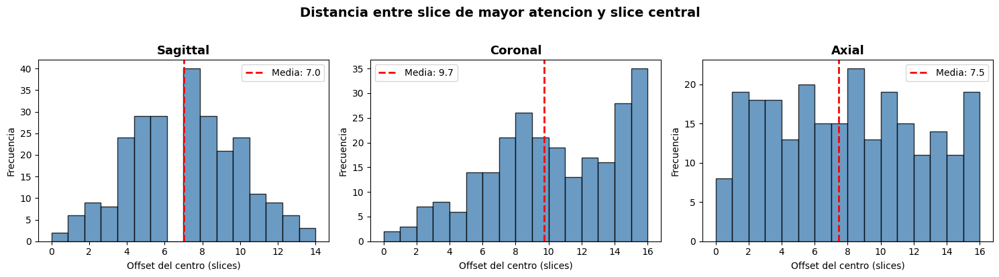


Este resultado demuestra que la practica habitual de aplicar GradCAM
sobre el slice central no refleja la decision real del modelo.


In [28]:
# Analisis: distancia entre slice de atencion y slice central
print("="*70)
print("ANALISIS: SLICE DE ATENCION vs SLICE CENTRAL")
print("="*70)

best_model.to(device); best_model.eval()
offsets = {'sagittal': [], 'coronal': [], 'axial': []}

for _, cr in test_df.iterrows():
    cidx = test_df[test_df['case'] == cr['case']].index[0]
    (sag, cor, axi), _ = test_ds[cidx]
    attn = best_model.get_attention_weights(
        sag.unsqueeze(0).to(device), cor.unsqueeze(0).to(device), axi.unsqueeze(0).to(device))
    mid = CONFIG['target_slices'] // 2
    for pn, aw in attn.items():
        top = int(np.argmax(aw))
        offsets[pn].append(abs(top - mid))

print(f"{'Plano':12s} {'Offset medio':>14s} {'Offset max':>12s} {'% != centro':>14s}")
print("-" * 55)
for pn in ['sagittal', 'coronal', 'axial']:
    o = offsets[pn]
    non_center = sum(1 for x in o if x > 0)
    print(f"{pn:12s} {np.mean(o):13.1f} {max(o):11d} {non_center/len(o)*100:13.1f}%")

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for i, pn in enumerate(['sagittal', 'coronal', 'axial']):
    axes[i].hist(offsets[pn], bins=16, color='steelblue', alpha=0.8, edgecolor='black')
    axes[i].axvline(np.mean(offsets[pn]), color='red', ls='--', lw=2,
                    label=f'Media: {np.mean(offsets[pn]):.1f}')
    axes[i].set_title(f'{pn.capitalize()}', fontsize=13, fontweight='bold')
    axes[i].set_xlabel('Offset del centro (slices)')
    axes[i].set_ylabel('Frecuencia')
    axes[i].legend()
plt.suptitle('Distancia entre slice de mayor atencion y slice central',
            fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'slice_offset_analysis.png'), dpi=200, bbox_inches='tight')
plt.show()
print("\nEste resultado demuestra que la practica habitual de aplicar GradCAM")
print("sobre el slice central no refleja la decision real del modelo.")
print("="*70)

## 10. Exportacion

In [29]:
# Guardar JSON de interpretabilidad
interp_json = {
    'n_cases': len(all_reports),
    'cases': [{k: v for k, v in r.items() if k != 'report_text'}
              for r in all_reports]
}
with open(os.path.join(SAVE_DIR, 'interpretability.json'), 'w') as f:
    json.dump(interp_json, f, indent=2, default=str)

# Resumen final
print("="*60)
print("="*60)
print("RESUMEN FINAL")
print("="*60)
print(f"")
print(f"Configuracion:")
print(f"  Pesos ACL: Sag={CONFIG['acl_weights'][0]}, Cor={CONFIG['acl_weights'][1]}, Axi={CONFIG['acl_weights'][2]}")
print(f"  Loss: WeightedBCE (pos_weight={CONFIG['phase2_pos_weight']})")
print(f"  Regularizacion: Dropout 0.5, freeze layers 1-3, early stopping")
print(f"  Preprocesamiento: CLAHE + mascara anatomica")
print(f"  Pooling: Attention pooling sobre slices")
print(f"  Threshold: clinico (Sens >= {CONFIG['target_sensitivity']*100:.0f}%)")
print(f"")
print(f"Resultados (5-fold CV):")
print(f"  Sensitivity: {np.mean(sens_s)*100:.1f}% +/- {np.std(sens_s)*100:.1f}%")
print(f"  Specificity: {np.mean(spec_s)*100:.1f}% +/- {np.std(spec_s)*100:.1f}%")
print(f"  F1-Score:    {np.mean(f1_s):.3f} +/- {np.std(f1_s):.3f}")
print(f"  AUC:         {np.mean(auc_s):.3f} +/- {np.std(auc_s):.3f}")
print(f"")
print(f"Archivos generados:")
for root, dirs, files in os.walk(SAVE_DIR):
    for f in sorted(files):
        rel = os.path.join(root, f).replace(SAVE_DIR + '/', '')
        print(f"  {rel}")
print("="*60)

RESUMEN FINAL

Configuracion:
  Pesos ACL: Sag=0.55, Cor=0.35, Axi=0.1
  Loss: WeightedBCE (pos_weight=2.0)
  Regularizacion: Dropout 0.5, freeze layers 1-3, early stopping
  Preprocesamiento: CLAHE + mascara anatomica
  Pooling: Attention pooling sobre slices
  Threshold: clinico (Sens >= 85%)

Resultados (5-fold CV):
  Sensitivity: 84.7% +/- 5.9%
  Specificity: 64.0% +/- 9.6%
  F1-Score:    0.533 +/- 0.049
  AUC:         0.838 +/- 0.022

Archivos generados:
  interpretability.json
  results.json
  models/fold1.pth
  models/fold2.pth
  models/fold3.pth
  models/fold4.pth
  models/fold5.pth
  interpretability/error_FN_0311.png
  interpretability/error_FN_0539.png
  interpretability/error_FN_0773.png
  interpretability/error_FN_0850.png
  interpretability/error_FP_0019.png
  interpretability/error_FP_0027.png
  interpretability/error_FP_0031.png
  interpretability/error_FP_0033.png
  interpretability/gradcam_FN_0311.png
  interpretability/gradcam_FP_0019.png
  interpretability/gradcam_T

In [30]:
# Copiar a /kaggle/output
import shutil
dst = '/kaggle/output'
os.makedirs(dst, exist_ok=True)
for item in os.listdir(SAVE_DIR):
    src = os.path.join(SAVE_DIR, item)
    if os.path.isfile(src):
        shutil.copy2(src, os.path.join(dst, item))
    elif os.path.isdir(src):
        shutil.copytree(src, os.path.join(dst, item), dirs_exist_ok=True)
print("Exportado a /kaggle/output")

Exportado a /kaggle/output


In [31]:
# Aplicar el mismo preprocesamiento que al dataset MRNet
def preprocess_personal_volume(volume, plane, config):
    """Aplica el pipeline completo a un volumen personal."""
    target_slices = config['target_slices']
    target_size = config['target_size']
    S = volume.shape[0]
    
    # 1. Selección/padding de cortes a 32
    if S >= target_slices:
        start = (S - target_slices) // 2
        volume = volume[start:start + target_slices]
    else:
        pad_before = (target_slices - S) // 2
        pad_after = target_slices - S - pad_before
        volume = np.pad(volume, ((pad_before, pad_after), (0,0), (0,0)), mode='edge')
    
    processed = []
    clahe = cv2.createCLAHE(
        clipLimit=config['clahe_clip_limit'],
        tileGridSize=(config['clahe_grid_size'], config['clahe_grid_size'])
    )
    
    for i in range(target_slices):
        img = volume[i].astype(np.float32)
        
        # 2. Center crop 95%
        h, w = img.shape
        crop = config['center_crop_ratio']
        ch, cw = int(h * crop), int(w * crop)
        sh, sw = (h - ch) // 2, (w - cw) // 2
        img = img[sh:sh+ch, sw:sw+cw]
        
        # 3. Resize a 224x224
        img = cv2.resize(img, (target_size, target_size), interpolation=cv2.INTER_LINEAR)
        
        # 4. CLAHE
        img_u8 = np.clip(img, 0, 255).astype(np.uint8)
        img = clahe.apply(img_u8).astype(np.float32) / 255.0
        
        # 5. Máscara anatómica (solo sagital)
        if plane == 'sagittal' and config.get('mask_enabled', True):
            y = np.linspace(0, 1, target_size)
            x = np.linspace(0, 1, target_size)
            yy, xx = np.meshgrid(y, x, indexing='ij')
            mask = (1 - config['mask_min_weight']) * np.exp(
                -((yy - config['mask_center_y'])**2 / (2 * config['mask_sigma_y']**2) +
                  (xx - config['mask_center_x'])**2 / (2 * config['mask_sigma_x']**2))
            ) + config['mask_min_weight']
            img = img * mask.astype(np.float32)
        
        processed.append(img)
    
    volume_out = np.stack(processed)
    
    # 6. Normalización min-max por volumen
    vmin, vmax = volume_out.min(), volume_out.max()
    volume_out = (volume_out - vmin) / (vmax - vmin + 1e-8)
    
    return torch.FloatTensor(volume_out).unsqueeze(0)  # (1, 32, 224, 224)

# Preprocesar los tres planos
sag = preprocess_personal_volume(personal_volumes['sagittal'], 'sagittal', CONFIG)
cor = preprocess_personal_volume(personal_volumes['coronal'], 'coronal', CONFIG)
axi = preprocess_personal_volume(personal_volumes['axial'], 'axial', CONFIG)

print(f"Sagital: {sag.shape}")
print(f"Coronal: {cor.shape}")
print(f"Axial:   {axi.shape}")

Sagital: torch.Size([1, 32, 224, 224])
Coronal: torch.Size([1, 32, 224, 224])
Axial:   torch.Size([1, 32, 224, 224])


In [32]:
# Cargar el mejor modelo (fold con mejor AUC)
best_fold_idx = np.argmax(auc_s)
best_fold_num, best_model, best_thr, _ = best_models[best_fold_idx]
print(f"Usando modelo del Fold {best_fold_num} (AUC: {auc_s[best_fold_idx]:.3f}, Umbral: {best_thr:.3f})")

best_model.to(device)
best_model.eval()

with torch.no_grad():
    s_in = sag.unsqueeze(0).to(device)  # (1, 1, 32, 224, 224)
    c_in = cor.unsqueeze(0).to(device)
    a_in = axi.unsqueeze(0).to(device)
    
    # Fase 1
    p1_result = best_model(s_in, c_in, a_in, phase=1, return_individual=True)
    p1_prob = torch.sigmoid(p1_result['fused']).item()
    
    # Fase 2
    p2_result = best_model(s_in, c_in, a_in, phase=2, return_individual=True)
    acl_prob = p2_result['fused'][0, 0].item()
    men_prob = p2_result['fused'][0, 1].item()
    
    # Info por plano
    p2_probs_per_plane = {}
    for plane, logits_key, attn_key in [
        ('sagittal', 'sagittal', 'attn_sag'),
        ('coronal', 'coronal', 'attn_cor'),
        ('axial', 'axial', 'attn_axi')
    ]:
        logits = p2_result[logits_key]
        probs = torch.sigmoid(logits).cpu().numpy()[0]
        attn = p2_result[attn_key].cpu().numpy()[0]
        if attn.ndim > 1:
            attn = attn.flatten()
        p2_probs_per_plane[plane] = {
            'probs': probs,
            'attention': attn,
            'best_slice': int(np.argmax(attn))
        }

print(f"\n{'='*60}")
print(f"RESULTADO - RM PERSONAL")
print(f"{'='*60}")
print(f"\n  FASE 1 - Anomalía general:")
print(f"    Probabilidad: {p1_prob:.3f}")
print(f"    Predicción:   {'ANOMALÍA DETECTADA' if p1_prob > 0.30 else 'NORMAL'}")
print(f"\n  FASE 2 - Clasificación:")
print(f"    LCA:     {acl_prob:.3f} ({'SOSPECHA DE LESIÓN' if acl_prob >= best_thr else 'Sin hallazgos'})")
print(f"    Menisco: {men_prob:.3f} ({'SOSPECHA DE LESIÓN' if men_prob >= 0.5 else 'Sin hallazgos'})")
print(f"    Umbral LCA: {best_thr:.3f}")
print(f"\n  Análisis por plano (LCA):")
for plane in ['sagittal', 'coronal', 'axial']:
    p = p2_probs_per_plane[plane]
    print(f"    {plane:10s}: prob={p['probs'][0]:.3f}  corte_relevante={p['best_slice']+1}/32  atención_max={p['attention'].max():.3f}")

Usando modelo del Fold 4 (AUC: 0.870, Umbral: 0.330)

RESULTADO - RM PERSONAL

  FASE 1 - Anomalía general:
    Probabilidad: 0.651
    Predicción:   ANOMALÍA DETECTADA

  FASE 2 - Clasificación:
    LCA:     0.847 (SOSPECHA DE LESIÓN)
    Menisco: 0.816 (SOSPECHA DE LESIÓN)
    Umbral LCA: 0.330

  Análisis por plano (LCA):
    sagittal  : prob=0.998  corte_relevante=16/32  atención_max=0.045
    coronal   : prob=0.596  corte_relevante=1/32  atención_max=0.075
    axial     : prob=0.896  corte_relevante=20/32  atención_max=0.090


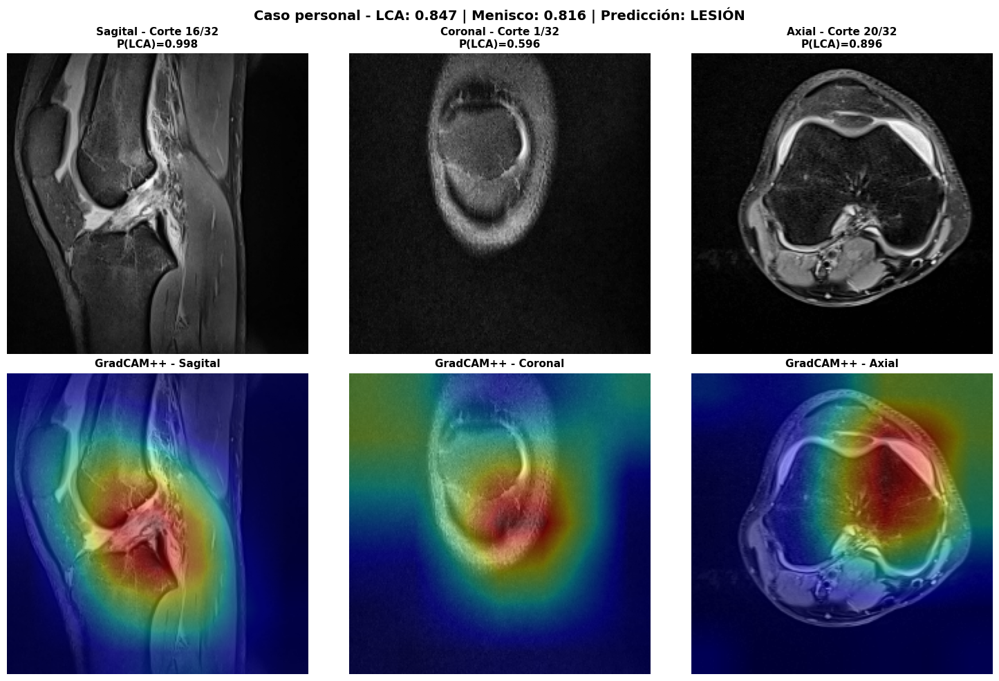

In [33]:
# GradCAM++ sobre el corte de mayor atención
def gradcampp_personal(model, plane_model, input_tensor, target_slice, target_class=0):
    model.eval()
    # input_tensor: (1, 1, 32, 224, 224) -> extraer corte: (1, 1, 224, 224)
    slice_input = input_tensor[:, :, target_slice]  # (1, 1, 224, 224)
    
    activations = {}
    gradients = {}
    
    def fwd_hook(module, input, output):
        activations['value'] = output
    def bwd_hook(module, grad_in, grad_out):
        gradients['value'] = grad_out[0]
    
    handle_fwd = plane_model.layer4.register_forward_hook(fwd_hook)
    handle_bwd = plane_model.layer4.register_full_backward_hook(bwd_hook)
    
    output = plane_model(slice_input)
    target = output[0, target_class]
    
    model.zero_grad()
    target.backward()
    
    act = activations['value'].detach()
    grad = gradients['value'].detach()
    
    grad_pow2 = grad ** 2
    grad_pow3 = grad ** 3
    sum_act = act.sum(dim=(2, 3), keepdim=True)
    alpha = grad_pow2 / (2 * grad_pow2 + sum_act * grad_pow3 + 1e-8)
    weights = (alpha * torch.relu(grad)).sum(dim=(2, 3), keepdim=True)
    
    cam = torch.relu((weights * act).sum(dim=1, keepdim=True))
    cam = torch.nn.functional.interpolate(cam, size=(224, 224), mode='bilinear', align_corners=False)
    cam = cam.squeeze().cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    
    handle_fwd.remove()
    handle_bwd.remove()
    
    return cam

# Generar GradCAM para cada plano
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
planes_data = [
    ('Sagital', best_model.p2_sag, s_in, p2_probs_per_plane['sagittal']),
    ('Coronal', best_model.p2_cor, c_in, p2_probs_per_plane['coronal']),
    ('Axial', best_model.p2_axi, a_in, p2_probs_per_plane['axial']),
]

for col, (name, plane_model, plane_input, plane_info) in enumerate(planes_data):
    best_sl = plane_info['best_slice']
    
    # Imagen original: (1, 1, 32, 224, 224) -> [0, 0, best_sl] -> (224, 224)
    orig_img = plane_input[0, 0, best_sl].cpu().numpy()
    axes[0, col].imshow(orig_img, cmap='gray')
    axes[0, col].set_title(f'{name} - Corte {best_sl+1}/32\n'
                           f'P(LCA)={plane_info["probs"][0]:.3f}', fontsize=11, fontweight='bold')
    axes[0, col].axis('off')
    
    # GradCAM++
    cam = gradcampp_personal(best_model, plane_model, plane_input, best_sl, target_class=0)
    axes[1, col].imshow(orig_img, cmap='gray')
    axes[1, col].imshow(cam, cmap='jet', alpha=0.4)
    axes[1, col].set_title(f'GradCAM++ - {name}', fontsize=11, fontweight='bold')
    axes[1, col].axis('off')

plt.suptitle(f'Caso personal - LCA: {acl_prob:.3f} | Menisco: {men_prob:.3f} | '
             f'Predicción: {"LESIÓN" if acl_prob >= best_thr else "SIN LESIÓN"}',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'caso_personal_gradcam.png'), dpi=200, bbox_inches='tight')
plt.show()

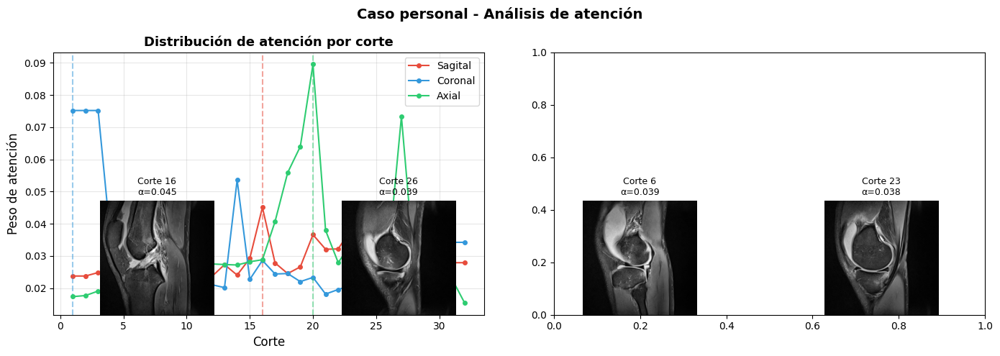


Figuras guardadas en /kaggle/working/TFG_FINAL/figures/


In [34]:
# Mapa de atención del plano sagital
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Atención por corte
for plane, color, label in [('sagittal', '#e74c3c', 'Sagital'),
                             ('coronal', '#3498db', 'Coronal'),
                             ('axial', '#2ecc71', 'Axial')]:
    attn = p2_probs_per_plane[plane]['attention']
    axes[0].plot(range(1, 33), attn, '-o', color=color, label=label, markersize=4)
    best_sl = p2_probs_per_plane[plane]['best_slice']
    axes[0].axvline(best_sl + 1, color=color, ls='--', alpha=0.5)

axes[0].set_xlabel('Corte', fontsize=12)
axes[0].set_ylabel('Peso de atención', fontsize=12)
axes[0].set_title('Distribución de atención por corte', fontsize=13, fontweight='bold')
axes[0].legend(fontsize=10)
axes[0].grid(alpha=0.3)

# Cortes sagitales más relevantes
sag_attn = p2_probs_per_plane['sagittal']['attention']
top_slices = np.argsort(sag_attn)[-4:][::-1]  # Top 4

for i, sl in enumerate(top_slices):
    ax_sub = fig.add_subplot(2, 4, 5+i)
    ax_sub.imshow(s_in[0, 0, sl].cpu().numpy(), cmap='gray')
    ax_sub.set_title(f'Corte {sl+1}\nα={sag_attn[sl]:.3f}', fontsize=9)
    ax_sub.axis('off')

plt.suptitle('Caso personal - Análisis de atención', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(SAVE_DIR, 'figures', 'caso_personal_atencion.png'), dpi=200, bbox_inches='tight')
plt.show()

print(f"\nFiguras guardadas en {SAVE_DIR}/figures/")